# **Business Understanding**
## **`Problem`**
Company X merupakan company yang bergerak dibidang peminjaman uang kepada nasabah. Company X ingin mengetahui nasabah yang tidak mampu membayar pinjaman,
dan agak sulit saat coba dihubungi.

## **`Goals`**
Membantu Company X memprediksi nasabah yang gagal membayar pinjaman.
## **`Objective`**
- Membangun model machine learning yang dapat memprediksi nasabah yang gagal membayar pinjaman (Jika nasabah terdeteksi berpotensi akan gagal bayar pinjaman oleh model, akan segera dihubungi lebih dulu dan ditawarkan solusi. Misal penundaan cicilan, pengurangan bunga, dsb. Ini lebih baik
daripada nasabah kabur)
- Membangun model yang dapat memprediksi calon nasabah dapat membayar pinjaman atau tidak. Dengan begitu pemberi pinjaman dapat membuat keputusan yang lebih bijak dalam memberikan atau menolak pinjaman kepada calon nasabah, serta mengurangi risiko kredit bagi lembaga keuangan.

## **`Business Metrics`**
Default rate (% user yang default / gagal bayar)


In [1]:
#import warnings

In [2]:
#warnings.filterwarnings("ignore", category=UserWarning, module="matplotlib")

In [3]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
import pandas as pd
df = pd.read_csv('/content/drive/MyDrive/data/loan.csv')
df.head(10)

<ipython-input-5-a65ec53fee51>:2: DtypeWarning: Columns (20) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('/content/drive/MyDrive/data/loan.csv')


,Unnamed: 0,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,...,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m
0,0,1077501,1296599,5000,5000,4975.0,36 months,10.65,162.87,B,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,1077430,1314167,2500,2500,2500.0,60 months,15.27,59.83,C,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,1077175,1313524,2400,2400,2400.0,36 months,15.96,84.33,C,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,1076863,1277178,10000,10000,10000.0,36 months,13.49,339.31,C,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,1075358,1311748,3000,3000,3000.0,60 months,12.69,67.79,B,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,5,1075269,1311441,5000,5000,5000.0,36 months,7.90,156.46,A,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,6,1069639,1304742,7000,7000,7000.0,60 months,15.96,170.08,C,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,7,1072053,1288686,3000,3000,3000.0,36 months,18.64,109.43,E,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,8,1071795,1306957,5600,5600,5600.0,60 months,21.28,152.39,F,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,9,1071570,1306721,5375,5375,5350.0,60 months,12.69,121.45,B,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Explore data
Kita memiliki 466285 data yang akan digunakan yang masing - masing memiliki 74 kolom. Kolom - kolom tersebut memiliki arti :
1. **id** : ID
2. **member_id** : ID unik untuk anggota nasabah.
3. **loan_amnt** : Pembayaran bulan lalu diterima
4. **funded_amnt** : Jumlah total nasabah yang berkomitmen untuk pinjaman pada saat itu.
5. **funded_amnt_inv** :
6. **term** :
7. **int_rate** : Pendapatan diverifikasi, tidak diverifikasi, atau jika sumber pendapatan diverifikasi
8. **installment** : Pembayaran bulanan yang terhutang oleh nasabah
9. **grade** :
10. **sub_grade** : LC Ditugaskan Subgrade Pinjaman
11. **emp_title** : Pekerjaan yang diajukan oleh nasabah saat mengajukan pinjaman.
12. **emp_length** : Lama bekerja dalam beberapa tahun. Nilai yang mungkin adalah antara 0 dan 10 di mana 0 berarti kurang dari satu tahun dan 10 berarti sepuluh tahun atau lebih.           
13. **home_ownership** : Status kepemilikan rumah nasabah selama pendaftaran. Nilai -nilai kami adalah: sewa, sendiri, hipotek, lainnya.      
14. **annual_inc** :                   
15. **verification_status** :         
16. **issue_d** : Bulan yang dilakukan pinjaman oleh nasabah
17. **loan_status** : Status pinjaman                
18. **pymnt_plan** : Status pembayaran pinjaman nasabah dengan cara pembayaran biasa (full payment) atau dengan cara cicilan (installment plan).                    
19. **url** : URL            
20. **desc** : Deskripsi pinjaman nasabah
21. **purpose** :                     
22. **title** :                        
23. **zip_code** : 3 nomor pertama dari kode pos nasabah dalam aplikasi pinjaman
24. **addr_state** : Negara nasabah dalam aplikasi pinjaman                  
25. **dti** :                          
26. **delinq_2yrs** : Jumlah 30+ hari insiden kenakalan kredit peminjam selama 2 tahun terakhir                
27. **earliest_cr_line** : Kredit bulan awal nasabah  
28. **inq_last_6mths** : Jumlah pertanyaan dalam 6 bulan terakhir (tidak termasuk penyelidikan mobil dan hipotek)              
29. **mths_since_last_delinq** : Jumlah bulan kenakalan terakhir nasabah.     
30. **mths_since_last_record** : Jumlah bulan catatan publik terakhir.      
31. **open_acc** : Jumlah jalur kredit terbuka dalam kredit nasabah                   
32. **pub_rec** : Jumlah catatan publik                  
33. **revol_bal** : Total Saldo Revolving Credit                    
34. **revol_util** : Tingkat pemanfaatan jalur bergulir, atau jumlah kredit yang digunakan nasabah relatif terhadap semua kredit revolving yang tersedia.                   
35. **total_acc** : Jumlah total jalur kredit saat ini dalam kredit nasabah  
36. **initial_list_status** : Status daftar awal pinjaman. Nilai yang mungkin adalah - utuh, fraksional        
37. **out_prncp** : Jumlah total yang didanai              
38. **out_prncp_inv** : Jumlah total tersisa sebagian yang didanai oleh investor            
39. **total_pymnt** : Pembayaran diterima hingga saat ini untuk jumlah total yang didanai               
40. **total_pymnt_inv** : Pembayaran diterima hingga saat ini untuk sebagian dari jumlah total yang didanai oleh investor           
41. **total_rec_prncp** : Total diterima hingga saat ini           
42. **total_rec_int** : Bunga diterima hingga saat ini            
43. **total_rec_late_fee** : Biaya keterlambatan yang diterima hingga saat ini       
44. **recoveries** : Menunjukkan rencana pembayaran telah diberlakukan untuk pinjaman             
45. **collection_recovery_fee** : Biaya pengumpulan        
46. **last_pymnt_d** : Bulan lalu pembayaran diterima               
47. **last_pymnt_amnt** : Jumlah total pembayaran terakhir yang diterima             
48. **next_pymnt_d** : Tanggal Pembayaran Terjadwal Berikutnya                
49. **last_credit_pull_d** :          
50. **collections_12_mths_ex_med** : Jumlah koleksi dalam 12 bulan tidak termasuk koleksi medis  
51. **mths_since_last_major_derog** : Bulan sejak peringkat 90 hari atau lebih buruk terakhir
52. **policy_code** : "Policy_code yang tersedia untuk umum = 1
Produk Baru Tidak Tersedia Umum Kebijakan_Code = 2"               
53. **application_type** : Menunjukkan apakah pinjaman tersebut merupakan aplikasi individu atau aplikasi bersama dengan dua peminjam bersama            
54. **annual_inc_joint** : Penghasilan tahunan yang dilaporkan sendiri
55. **dti_joint** : Rasio yang dihitung menggunakan total pembayaran bulanan peminjam bersama atas total kewajiban utang, tidak termasuk hipotek dan pinjaman LC yang diminta, dibagi oleh pendapatan bulanan yang dilaporkan sendiri oleh co-peminjam yang dilaporkan sendiri               
56. **verification_status_joint** :    
57. **acc_now_delinq** : Jumlah akun nasabah nakal.
58. **tot_coll_amt** : Total jumlah pengumpulan yang pernah ada                
59. **tot_cur_bal** : Total Saldo Saat Ini dari Semua Akun                 
60. **open_acc_6m** : Jumlah perdagangan terbuka dalam 6 bulan terakhir                 
61. **open_il_6m** : Jumlah akun angsuran yang dibuka dalam 12 bulan terakhir                 
62. **open_il_12m** : Jumlah perdagangan terbuka dalam 6 bulan terakhir                 
63. **open_il_24m** : Jumlah akun angsuran yang dibuka dalam 24 bulan terakhir                
64. **mths_since_rcnt_il** : Bulan sejak akun angsuran terbaru dibuka         
65. **total_bal_il** : Total saldo saat ini dari semua akun angsuran               
66. **il_util** : Rasio total saldo saat ini dengan batas kredit/kredit tinggi pada semua instal acct                     
67. **open_rv_12m** : Jumlah perdagangan revolving dibuka dalam 12 bulan terakhir                  
68. **open_rv_24m** : Jumlah perdagangan revolving dibuka dalam 24 bulan terakhir                 
69. **max_bal_bc** : Saldo arus maksimum terutang pada semua akun bergulir             
70. **all_util**  : Saldo ke batas kredit untuk semua perdagangan                  
71. **total_rev_hi_lim** : Total Batas Kredit/Kredit Tinggi Revolving           
72. **inq_fi** : Jumlah pertanyaan keuangan pribadi                     
73. **total_cu_tl** : Jumlah Perdagangan Keuangan               
74. **inq_last_12m** : Jumlah pertanyaan kredit dalam 12 bulan terakhir               

# **Exploratory Data Analysis**


# **Descriptive Statistics**

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 466285 entries, 0 to 466284
Data columns (total 75 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   Unnamed: 0                   466285 non-null  int64  
 1   id                           466285 non-null  int64  
 2   member_id                    466285 non-null  int64  
 3   loan_amnt                    466285 non-null  int64  
 4   funded_amnt                  466285 non-null  int64  
 5   funded_amnt_inv              466285 non-null  float64
 6   term                         466285 non-null  object 
 7   int_rate                     466285 non-null  float64
 8   installment                  466285 non-null  float64
 9   grade                        466285 non-null  object 
 10  sub_grade                    466285 non-null  object 
 11  emp_title                    438697 non-null  object 
 12  emp_length                   445277 non-null  object 
 13 

In [7]:
df.isna().sum()

Unnamed: 0               0
id                       0
member_id                0
loan_amnt                0
funded_amnt              0
                     ...  
all_util            466285
total_rev_hi_lim     70276
inq_fi              466285
total_cu_tl         466285
inq_last_12m        466285
Length: 75, dtype: int64

In [8]:
# Melihat jumlah data
for col in df:
    print(f'''Value count kolom {col}:''')
    print(df[col].value_counts())
    print()

Value count kolom Unnamed: 0:
0         1
310839    1
310865    1
310864    1
310863    1
         ..
155424    1
155423    1
155422    1
155421    1
466284    1
Name: Unnamed: 0, Length: 466285, dtype: int64

Value count kolom id:
1077501     1
26180404    1
26219322    1
26239577    1
26290537    1
           ..
3714715     1
3703738     1
3731030     1
3705772     1
9199665     1
Name: id, Length: 466285, dtype: int64

Value count kolom member_id:
1296599     1
28653081    1
28692177    1
28702376    1
28763241    1
           ..
4686866     1
4847180     1
4724047     1
4678105     1
11061576    1
Name: member_id, Length: 466285, dtype: int64

Value count kolom loan_amnt:
10000    33023
12000    25519
15000    23486
20000    22759
35000    16596
         ...  
34250        1
33400        1
32150        1
34325        1
33175        1
Name: loan_amnt, Length: 1352, dtype: int64

Value count kolom funded_amnt:
10000    32930
12000    25426
15000    23370
20000    22571
35000    16458

Dapat dilihat bahwa :
- Dataframe memiliki total 466285 baris dan 75 kolom
- Dataframe masih memiliki beberapa null values di beberapa kolom seperti : `emp_title`, `emp_length`, `annual_inc`, `desc`, `title`, `delinq_2yrs`, `earliest_cr_line`, `inq_last_6mths`, `mths_since_last_delinq`, `mths_since_last_record`, `open_acc`, `pub_rec`, `revol_util`, `total_acc`, `last_pymnt_d`, `next_pymnt_d`, `last_credit_pull_d`, `collections_12_mths_ex_med`, `mths_since_last_major_derong`, `annual_inc_joint`, `dti_joint`, `verification_status_joint`, `acc_now_delinq`, `tot_coll_amt`, `tot_cur_bal`, `open_acc_6m`, `open_il_6m`, `open_il_12m`, `open_il_24m`, `mths_since_rcnt_il`, `total_bal_il`, `il_util`, `open_rv_12m`, `open_rv_24m`, `max_bal_bc`, `all_util`, `total_rev_hi_lim`, `inq_fi`, `total_cu_tl`, `inq_last_12m`.
- Banyak terdapat data yang tidak ada isinya sama sekali seperti : `annual_inc_joint`, `dti_joint`, `verification_status_joint`, `open_acc_6m`, `open_il_6m`, `open_il_12m`, `open_il_24m`, `mths_since_rcnt_il`, `total_bal_il`, `il_util`, `open_rv_12m`, `open_rv_24m`, `max_bal_bc`, `all_util`, `inq_fi`, `total_cu_tl`, `inq_last_12m`, sehingga datanya perlu dilakukan drop karena tidak mendefenisikan nilai sama sekali.
- Target klasifikasinya akan ada di kolom `loan status` akan tetapi masih berbentuk data object sehingga perlu dilakukan pemecahan data menjadi 2 kriteria **1 : default / gagal bayar** dan **0 : pay / bayar**, dan dilakukan perubahan type data menjadi integer.
- Tipe data sudah sesuai pada setiap kolom.
- Pada kolom `initial status` perlu didefenisikan kembali nilai `f` dan `w` sebagai **f :Fully Funded**, **w : Not Yet Fully Funded**
- Pada kolom `pymnt_plan` perlu didefenisikan kembali nilai `n` dan `y` sebagai **n :Not an installment plan / pembayaran biasa**, **y : Is an installment plan / pembayaran cicilan**.
- Data target pada kolom `loan_status` sepertinya tidak balance sehingga perlu dilakukan handle class imbalance menggunakan oversampling atau undersampling.

In [9]:
print(df["loan_status"].value_counts())

Current                                                224226
Fully Paid                                             184739
Charged Off                                             42475
Late (31-120 days)                                       6900
In Grace Period                                          3146
Does not meet the credit policy. Status:Fully Paid       1988
Late (16-30 days)                                        1218
Default                                                   832
Does not meet the credit policy. Status:Charged Off       761
Name: loan_status, dtype: int64


In [10]:
# Membuat kolom baru label
label_map = {'Fully Paid': 0, 'Charged Off': 1, 'Late (31-120 days)': 1,
             'In Grace Period': 1, 'Does not meet the credit policy. Status:Fully Paid': 1,
             'Late (16-30 days)': 1, 'Default': 1, 'Does not meet the credit policy. Status:Charged Off': 1,
             'Current': 0}

df['label'] = df['loan_status'].apply(lambda x: label_map.get(x, None)).map({1: 1, 0: 0})

print(df['label'].value_counts())

0    408965
1     57320
Name: label, dtype: int64


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 466285 entries, 0 to 466284
Data columns (total 76 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   Unnamed: 0                   466285 non-null  int64  
 1   id                           466285 non-null  int64  
 2   member_id                    466285 non-null  int64  
 3   loan_amnt                    466285 non-null  int64  
 4   funded_amnt                  466285 non-null  int64  
 5   funded_amnt_inv              466285 non-null  float64
 6   term                         466285 non-null  object 
 7   int_rate                     466285 non-null  float64
 8   installment                  466285 non-null  float64
 9   grade                        466285 non-null  object 
 10  sub_grade                    466285 non-null  object 
 11  emp_title                    438697 non-null  object 
 12  emp_length                   445277 non-null  object 
 13 

### Sampling untuk memahami data, menghindari invalid values

In [12]:
df.sample(10)

,Unnamed: 0,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,...,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,label
341616,341616,21761124,24084064,16000,16000,16000.0,36 months,9.17,510.07,B,...,NaN,NaN,NaN,NaN,NaN,34200.0,NaN,NaN,NaN,0
169344,169344,3216719,3959098,23200,23200,23175.0,36 months,6.62,712.33,A,...,NaN,NaN,NaN,NaN,NaN,22081.0,NaN,NaN,NaN,0
62112,62112,8926361,10718393,21000,21000,21000.0,36 months,10.99,687.42,B,...,NaN,NaN,NaN,NaN,NaN,61200.0,NaN,NaN,NaN,0
324140,324140,24475005,26887936,7975,7975,7975.0,36 months,14.49,274.47,C,...,NaN,NaN,NaN,NaN,NaN,7300.0,NaN,NaN,NaN,0
76104,76104,7956531,9678586,15000,15000,15000.0,36 months,11.99,498.15,B,...,NaN,NaN,NaN,NaN,NaN,46500.0,NaN,NaN,NaN,0
391477,391477,15640396,17732827,12750,12750,12750.0,36 months,14.49,438.81,C,...,NaN,NaN,NaN,NaN,NaN,16700.0,NaN,NaN,NaN,0
39507,39507,198952,198937,2500,2500,550.0,36 months,7.43,77.69,A,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
262450,262450,33401504,36044827,18350,18350,18350.0,36 months,16.99,654.14,D,...,NaN,NaN,NaN,NaN,NaN,8500.0,NaN,NaN,NaN,0
71656,71656,8146896,9888898,30000,30000,30000.0,60 months,24.08,864.44,F,...,NaN,NaN,NaN,NaN,NaN,36000.0,NaN,NaN,NaN,0
211538,211538,1372339,1617154,10625,10625,10625.0,36 months,13.99,363.09,C,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0


# **Statistical Summary**

In [13]:
nums = ["loan_amnt","funded_amnt","funded_amnt_inv","int_rate","installment","annual_inc","dti","delinq_2yrs","inq_last_6mths","mths_since_last_delinq",
        "mths_since_last_record","open_acc","pub_rec","revol_bal","revol_util","total_acc","out_prncp","out_prncp_inv","total_pymnt","total_pymnt_inv",
        "total_rec_prncp","total_rec_int","total_rec_late_fee","recoveries","collection_recovery_fee","last_pymnt_amnt","collections_12_mths_ex_med",
        "mths_since_last_major_derog","policy_code","acc_now_delinq","tot_coll_amt","tot_cur_bal","total_rev_hi_lim"]
cats = ["term","grade","sub_grade","emp_title","emp_length","home_ownership","verification_status","issue_d","loan_status","pymnt_plan","url","desc",
        "purpose","title","zip_code","addr_state","earliest_cr_line","initial_list_status","last_pymnt_d","next_pymnt_d","last_credit_pull_d",
        "application_type"]

In [14]:
df[nums].describe().T

,count,mean,std,min,25%,50%,75%,max
loan_amnt,466285.0,14317.277577,8286.509164,500.00,8000.000000,12000.000000,20000.00000,3.500000e+04
funded_amnt,466285.0,14291.801044,8274.371300,500.00,8000.000000,12000.000000,20000.00000,3.500000e+04
funded_amnt_inv,466285.0,14222.329888,8297.637788,0.00,8000.000000,12000.000000,19950.00000,3.500000e+04
int_rate,466285.0,13.829236,4.357587,5.42,10.990000,13.660000,16.49000,2.606000e+01
installment,466285.0,432.061201,243.485550,15.67,256.690000,379.890000,566.58000,1.409990e+03
annual_inc,466281.0,73277.381470,54963.568654,1896.00,45000.000000,63000.000000,88960.00000,7.500000e+06
dti,466285.0,17.218758,7.851121,0.00,11.360000,16.870000,22.78000,3.999000e+01
delinq_2yrs,466256.0,0.284678,0.797365,0.00,0.000000,0.000000,0.00000,2.900000e+01
inq_last_6mths,466256.0,0.804745,1.091598,0.00,0.000000,0.000000,1.00000,3.300000e+01
mths_since_last_delinq,215934.0,34.104430,21.778487,0.00,16.000000,31.000000,49.00000,1.880000e+02


### Pendekatan Numeric
-  Nilai yang tertera pada setiap kolom masuk akal.
- Ada beberapa kolom yang memiliki selisih nilai min/max yang sangat jauh yaitu : `loan_amnt`, `funded_amnt`, `annual_inc`, `installment`
- Selisih nilai mean dan median pada beberapa kolom sudah signifikan, hanya saja ada beberapa kolom yang terdapat perbedaan yang jauh yaitu : `loan_amnt`,`funded_amnt`, `funded_amnt_inv`,`annual_inc`,`revol_bal`,`out_prncp`,`out_prncp_inv`,`total_pymnt`,`total_pymnt_inv`,`total_rec_prncp`,`total_rec_int`,`recoveries`, `last_pymnt_amnt`, `tot_coll_amt`, `tot_cur_bal`, `total_rev_hi_lim`.
- Beberapa kolom memiliki nilai mean > median yaitu : `loan_amnt`,`funded_amnt`,`funded_amnt_inv`,`int_rate`,`installment`,`annual_inc`,`dti`,`delinq_2yrs`,`inq_last_6mths`,`mths_since_last_delinq`,`open_acc`,`pub_rec`,`revol_bal`,`total_acc`,`out_prncp`,`out_prncp_inv`,`total_pymnt_inv`,`total_rec_prncp`,`total_rec_int`,`total_rec_late_fee`,`recoveries`,`collection_recovery_fee`,`last_pymnt_amnt`,`tot_coll_amt`,`tot_cur_bal`,`total_rev_hi_lim`, sehingga terindikasi **positively skewed**

In [15]:
df[cats].describe().T

,count,unique,top,freq
term,466285,2,36 months,337953
grade,466285,7,B,136929
sub_grade,466285,35,B3,31686
emp_title,438697,205475,Teacher,5399
emp_length,445277,11,10+ years,150049
home_ownership,466285,6,MORTGAGE,235875
verification_status,466285,3,Verified,168055
issue_d,466285,91,Oct-14,38782
loan_status,466285,9,Current,224226
pymnt_plan,466285,2,n,466276


### Pendekatan Categorikal
- Ada beberapa kolom yang memiliki unique values yang sangat banyak yaitu : `grade`,`sub_grade`, `emp_title`, `emp_length`, `home_ownership`,`issue_d`, `url`, `desc`, `purpose`, `title`, `zip_code`, `addr_state`, `earliest_cr_line`, `last_pymnt_d`, `next_pymnt_d`, `last_credit_pull_d`. Nilai unique yang banyak tersebut perlu dilakukan **Drop** karena jika tidak di drop nantinya akan mempengaruhi dalam pemodelan.

# **Univariate Analysis**

Setelah melakukan analisis sederhana tentang statistik deskriptif, sekarang kita fokus pada kolom Numeric dengan *Univariate Analysis* untuk melihat distribusinya.

### Boxplot

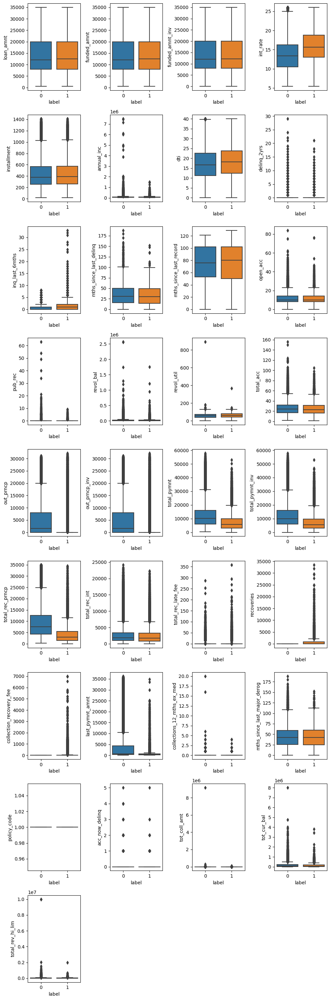

In [16]:
plt.figure(figsize=(10,30))
for i in range(0, len(nums)):
    plt.subplot(9, 4, i+1)
    sns.boxplot(y=df[nums[i]], orient='v', x = df['label'])
    plt.tight_layout()

### Violin Plots

In [17]:
nums = ["loan_amnt","funded_amnt","funded_amnt_inv","int_rate","installment","annual_inc","dti","delinq_2yrs","inq_last_6mths","mths_since_last_delinq",
        "mths_since_last_record","open_acc","pub_rec","revol_bal","revol_util","total_acc","out_prncp","out_prncp_inv","total_pymnt","total_pymnt_inv",
        "total_rec_prncp","total_rec_int","total_rec_late_fee","recoveries","collection_recovery_fee","last_pymnt_amnt","collections_12_mths_ex_med",
        "mths_since_last_major_derog","policy_code","acc_now_delinq","tot_coll_amt","tot_cur_bal","total_rev_hi_lim"]

fig, axs = plt.subplots(1, len(nums), figsize=(500, 100), squeeze=False)
for i, nums in enumerate(nums):
    #plt.subplot(9, 2, i+1)
    sns.violinplot(y=df[nums], ax=axs[0][i], hue=df['label'])
    axs[0][i].set_title(nums)
    axs[0][i].tick_params(axis='x', labelrotation=90)

plt.tight_layout()
plt.show()

Berdasarkan visualisasi diatas :
- Tidak terdapat data Outliers pada kolom `loan_amnt`,`funded_amnt`,`funded_amnt_inv`,`mths_since_last_record`.
- Outliers terdapat pada kolom `int_rate` target 0, kolom `installment`,`annual_inc`,`dti` target 0,`delinq_2yrs`,`inq_last_6mths`,`mths_since_last_delinq`,`open_acc`,`pub_rec`,`revol_bal`,`revol_util`,`total_acc`,`out_prncp`,`out_prncp_inv`,`total_pymnt`,`total_pymnt_inv`,`total_rec_prncp`,`total_rec_int`,`total_rec_late_fee`,`recoveries`,`collection_recovery_fee`,`last_pymnt_amnt`,`collections_12_mths_ex_med`,`mths_since_last_major_derog`,`policy_code`,`acc_now_delinq`,`tot_coll_amt`,`tot_cur_bal`,`total_rev_hi_lim`.

**1. `loan_amnt`**
- Distribusi data pada kolom `loan_amnt` antara nasabah yang gagal bayar (target 1) dan yang bayar (target 0) sama sekitar 9000 s/d 20000, Artinya jumlah yang dapat dibayarkan nasabah pada bulan lalu berkisar 9000 s/d 20000. Tetapi jumlah pembayaran paling banyak yang dilakukan nasabah bulan lalu sekitar 12000.
- Pada umumnya nasabah dapat melakukan pembayaran bulan lalu maximum 35000.

**2. `funded_amnt`**
- Distribusi data pada kolom `funded_amnt` antara nasabah yang gagal bayar (target 1) dan yang bayar (target 0) sama sekitar 9000 s/d 20000, Artinya jumlah total nasabah yang berkomitmen untuk pinjaman pada saat itu berkisar 9000 s/d 20000 orang.
- Pada umumnya total nasabah yang dapat melakukan pinjaman adalah maximum 35000.

**3. `int_rate`**
- Distribusi data pada kolom `int_rate` untuk nasabah gagal bayar (target 1) berkisar 14 s/d 19, sedangkan untuk nasabah yang bayar (target 0) berkisar 11 s/d 17. Artinya untuk nasabah yang gagal bayar (target 1) pendapatan yang terverifikasi sebanyak 14 s/d 19, sedangkan nasabah yang bayar (tarhet 0) pendapatan terverifikasi sebanyak 11 s/d 17. Tetapi data pendapatan terverifikasi paling banyak untuk nasabah yang gagal banyar (target 1) adalah 15, sedangkan nasabah yang bayar (target 0) adalah 13.
- Pada umumnya pendapatan nasabah yang terverifikasi berkisar 5-26, akan tetapi ada beberapa persen data pendapatan nasabah yang tidak terverifikasi untuk status nasabah yang melakukan bayar (target 0), beberapa persen data itu disebut **outlier**.

**4. `installment`**
- Distribusi data pada kolom `installment` antara nasabah yang gagal bayar (target 1) dan yang bayar (target 0) sama sekitar 250 s/d 590, Artinya jumlah pembayaran bulanan yang terhutang oleh nasabah berkisar 250 s/d 590. Tetapi jumlah pembayaran paling banyak terhutang sekitar 400.
- Pada umumnya jumlah pembayaran bulanan terhutang oleh nasabah maximum 10000, akan tetapi ada beberapa persen data pembayaran terhutang yang sangat jauh sampai 14000, beberapa persen data itu disebut **outlier**.

**5. `annual_inc`**
- Tidak diketahui persebaran distribusi data pada kolom `annual_inc`, hanya terdapat data **outlier** yang cukup jauh dari 0 s/d 8.

**6. `dti`**
- Distribusi data pada kolom `dti` untuk nasabah gagal bayar (target 1) berkisar 12 s/d 24, sedangkan untuk nasabah yang bayar (target 0) berkisar 11 s/d 23. Distribusi terbanyak untuk nasabah gagal bayar (target 1) sekitar 17, sedangkan nasabah yang bayar sekitar 16.
- Pada umumnya persebaran distribusinya maximum mencapai 40, akan tetapi ada beberapa persen data yang melebihi batas maximum pada nasabah yang lakukan bayar (target 0), beberapa persen data itu disebut **outlier**.

**7. `delinq_2yrs`**
- Tidak diketahui persebaran distribusi data pada kolom `delinq_2yrs`, hanya terdapat data **outlier** yang cukup jauh dari 0 s/d 30. Artinya selama 2 tahun terakhir ditemukan kejadian kenakalan kredit peminjam selama 30 hari (maksud dari kenakalan kredit disini tidak diketahui kenakalan dalam hal apa, sehingga sulit untuk didefenisikan).

**8. `inq_last_6mths`**
- Distribusi data pada kolom `inq_last_6mths` untuk nasabah gagal bayar (target 1) berkisar 0 s/d 2, sedangkan untuk nasabah yang bayar (target 0) berkisar 0 s/d 1. Artinya selama 6 bulan terakhir dilakukan pertanyaan terkait status kepemilikan aset nasabah seperti rumah, tanah (tidak termasuk penyelidikan mobil dan hipotek).
- Pada umumnya jumlah pertanyaan yang dilakukan maximum sebanyak 5, akan tetapi ada beberapa jumlah pertanyaan yang ditanyakan kepada nasabah gagal bayar (target 1) cukup jauh hingga 35 (Bisa jadi ini menjadi suatu yang sangat penting untuk ditanyakan kepada nasabah yang gagal bayar), beberapa jumlah pertanyaan yang cukup jauh itu disebut **outlier**.

**9.`mths_since_last_delinq`**
- Distribusi data pada kolom `mths_since_last_delinq` antara nasabah yang gagal bayar (target 1) dan yang bayar (target 0) sama sekitar 24 s/d 50, Artinya Jumlah data kenakalan nasabah dalam beberapa bulan (maksud dari kenakalan nasabah disini tidak dikatahui dalam hal apa sehingga sulit untuk didefenisikan).
- Pada umumnya ditemukan data jumlah kenakalan nasabah dalam beberapa bulan maximum 100, akan tetapi ada beberapa persen data jumlah kenakalan nasabah yang cukup jauh mencapai 150 pada nasabah yang gagal bayar (target 1), dan mencapai 180 yang bayar (target 0), beberapa persen data itu disebut **outlier**.

**10.`mths_since_last_record`**
-  Distribusi data pada kolom `mths_since_last_record` untuk nasabah gagal bayar (target 1) berkisar 55 s/d 100, sedangkan untuk nasabah yang bayar (target 0) berkisar 57 s/d 100. Artinya Jumlah catatan publik dalam beberapa bulan terakhir berkisar 55 s/d 100 untuk nasabah yang gagal bayar (target 1), dan 57 s/d 100 untuk nasabah yang bayar (target 0).
- Pada umumnya ditemukan jumlah catatan publik dalam beberapa bulan terakhir dari mulai 0 s/d 125.

**11. `open_acc`**
- Distribusi data pada kolom `open_acc` antara nasabah yang gagal bayar (target 1) dan yang bayar (target 0) sama sekitar 10 s/d 15. Artinya Jumlah jalur kredit terbuka dalam kredit nasabah sekitar 10 s/d 15.
- Pada umumnya Jumlah jalur kredit terbuka dalam kredit nasabah maximum 25, akan tetapi ada beberapa persen data jumlah jalur kredit nasabah yang cukup jauh hingga mencapai sekitar 80 untuk nasabah gagal bayar (target 1) dan mencapai 85 untuk nasabah yang bayar (target 0), beberapa persen data itu disebut **outlier**.

**12. `pub_rec`**
- Tidak diketahui persebaran distribusi data pada kolom `pub_rec`, hanya terdapat data **outlier** yang cukup jauh dari 0 s/d 2,5. Artinya jumlah catatan publik hingga mencapai 2,5.

**13. `revol_bal`**
- Tidak diketahui persebaran distribusi data pada kolom `revol_bal`, hanya terdapat data **outlier** yang cukup jauh dari 0 s/d 2,5. Artinya terdapat total saldo revolving credit yang cukup jauh hingga mencapai 2,5.

**14. `revol_util`**
- Distribusi data pada kolom `revol_util` antara nasabah yang gagal bayar (target 1) dan yang bayar (target 0) sama sekitar 50 s/d 70. Artinya jumlah kredit yang digunakan nasabah relatif terhadap semua kredit revolving yeng tersedia dari 50 s/d 70.
- Pada umumnya jumlah kredit yang digunakan nasabah relatif terhadap semua kredit revolving yeng tersedia adalah maximum 150, akan tetapi ditemukan beberapa jumlah kredit revolving nasabah yang cukup jauh mencapai 380 untuk nasabah gagal bayar (target 1) dan mencapai 850 untuk nasabah yang bayar (target 0), beberapa data yang cukup jauh itu disebut **outlier**.

**15. `total_acc`**
-  Distribusi data pada kolom `total_acc` antara nasabah yang gagal bayar (target 1) dan yang bayar (target 0) sama sekitar 19 s/d 38. Artinya jumlah total jalur kredit nasabah saat ini sekitar 19 s/d 38.
- Pada umumnya jumlah total jalur kredit nasabah saat ini maximum 59, akan tetapi ditemukan jumlah total jalur kredit nasabah saat ini yang cukup jauh mencapai 115 untuk nasabah gagal bayar (target 1), dan mencapai 160 untuk nasabah yang bayar, data  jumlah total jalur kredit nasabah saat ini yang cukup jauh itu disebut **outlier**.

**16. `out_prncp`**
- Distribusi data pada kolom `out_prncp` untuk nasabah yang bayar (target 0) sekitar 0 s/d 12000, sedangkan untuk nasabah yang gagal bayar (target 1) tidak ditemukan persebaran data distribusinya. Artinya jumlah total yang didanai kebanyakan untuk nasabah yang bayar (target 0) dengan distribusi terbanyak sekitar 0 s/d 12000.
- Pada umumnya jumlah total yang didanai maximum 20000, tetapi ada beberapa persen data ditemukan sangat jauh hingga mencapai 30000, begitupun juga untuk nasabah yang gagal bayar(target 1) tidak ditemukan persebaran distribusinya akan tetapi hanya ditemukan persebaran data yang sangat jauh hingga mencapai 30000. Persebaran data yang jauh itu disebut dengan **outlier**

**17. `out_prncp_inv`**
- Distribusi data pada kolom `out_prncp` untuk nasabah yang bayar (target 0) sekitar 0 s/d 12000, sedangkan untuk nasabah yang gagal bayar (target 1) tidak ditemukan persebaran data distribusinya. Artinya jumlah total tersisa sebagian yang didanai oleh investor kebanyakan untuk nasabah yang bayar (target 0) dengan distribusi terbanyak sekitar 0 s/d 12000.
- Pada umumnya jumlah total tersisa sebagian yang didanai oleh investor maximum 20000.

**18. `total_pymnt`**
-  Distribusi data pada kolom `total_pymnt` untuk nasabah gagal bayar (target 1) berkisar 2000 s/d 10000, sedangkan untuk nasabah yang bayar (target 0) berkisar 8000 s/d 18000. Artinya pembayaran diterima hingga saat ini untuk jumlah total yang didanai  kebanyakan untuk nasabah yang bayar (target 0) dengan distribusi terbanyak sekitar 8000 s/d 18000, sedangkan untuk nasabah yang gagal bayar sekitar 2000 s/d 10000.
- Pada umumnya pembayaran diterima hingga saat ini untuk jumlah total yang didanai maximum 32000 untuk nasabah yang bayar (target 0), sedangkan nasabah yang gagal bayar (target 1) maximum 10000. Akan tetapi ditemukan persebaran data yang jauh hingga mencapai 60000. Persebaran data yang jauh itu disebut dengan **outlier**

**19. `total_pymnt_inv`**
- Distribusi data pada kolom `total_pymnt_inv` untuk nasabah gagal bayar (target 1) berkisar 2000 s/d 10000, sedangkan untuk nasabah yang bayar (target 0) berkisar 8000 s/d 18000. Artinya pembayaran diterima hingga saat ini untuk sebagian dari jumlah total yang didanai oleh investor kebanyakan untuk nasabah yang bayar (target 0) dengan distribusi terbanyak sekitar 8000 s/d 18000, sedangkan untuk nasabah yang gagal bayar sekitar 2000 s/d 10000.
- Pada umumnya pembayaran diterima hingga saat ini untuk sebagian dari jumlah total yang didanai oleh investor maximum 32000 untuk nasabah yang bayar (target 0), sedangkan nasabah yang gagal bayar (target 1) maximum 10000. Akan tetapi ditemukan persebaran data yang jauh hingga mencapai 60000. Persebaran data yang jauh itu disebut dengan **outlier**.

**20. `total_rec_prncp`**
-  Distribusi data pada kolom `total_rec_prncp` untuk nasabah gagal bayar (target 1) berkisar 2000 s/d 5000, sedangkan untuk nasabah yang bayar (target 0) berkisar 5000 s/d 14000. Artinya total diterima pinjaman hingga saat ini kebanyakan untuk nasabah yang bayar (target 0) dengan distribusi terbanyak sekitar 5000 s/d 14000, sedangkan untuk nasabah yang gagal bayar sekitar 2000 s/d 5000.
- Pada umumnya total diterima pinjaman hingga saat ini maximum 25000 untuk nasabah yang bayar (target 0), sedangkan nasabah yang gagal bayar (target 1) maximum 14000. Akan tetapi ditemukan persebaran data yang jauh hingga mencapai 35000. Persebaran data yang jauh itu disebut dengan **outlier**.

**21. `total_rec_int`**
- Distribusi data pada kolom `total_rec_int` antara nasabah yang gagal bayar (target 1) dan yang bayar (target 0) sama sekitar 1000 s/d 4000. Artinya bunga diterima hingga saat ini sekitar 1000 s/d 4000.
- Pada umumnya bunga diterima hingga saat ini maximum 7500 untuk nasabah yang gagal bayar (target 1) dan nasabah yang bayar (target 0). Akan tetapi ditemukan persebaran data yang jauh hingga mencapai 25000. Persebaran data yang jauh itu disebut dengan **outlier**.

**22. `total_rec_late_fee`**
- Tidak diketahui persebaran distribusi data pada kolom `total_rec_late_fee`, hanya terdapat data **outlier** yang cukup jauh dari 0 s/d 350. Artinya biaya keterlambatan pembayaran yang diterima hingga saat ini berbeda-beda mulai dari 0 s/d 350 hari.

**23. `recoveries`**
- Distribusi data pada kolom `recoveries` untuk nasabah gagal bayar (target 1) berkisar 0 s/d 2000, sedangkan untuk nasabah yang bayar (target 0) tidak terdapat persebaran distribusinya. Artinya rencana pembayaran yang akan dilakukan nasabah telah diberlakukan untuk pinjaman berikutnya dengan diketahui persebaran distribusi terbanyak terdapat pada nasabah yang gagal bayar (target 1) sekitar 0 s/d 2000
- Pada umumnya rencana pembayaran yang akan dilakukan nasabah telah diberlakukan untuk pinjaman berikutnya maximum adalah 3000. Akan tetapi ditemukan persebaran data yang jauh hingga mencapai 35000. Persebaran data yang jauh itu disebut dengan **outlier**.

**24. `collection_recovery_fee`**
- Tidak diketahui persebaran distribusi data pada kolom `collection_recovery_fee`, hanya terdapat data **outlier** yang cukup jauh dari 0 s/d 7000. Artinya biaya pengumpulan berbeda-beda mulai dari 0 s/d 7000.

**25. `last_pymnt_amnt`**
- Distribusi data pada kolom `last_pymnt_amnt` untuk nasabah bayar (target 0) berkisar 0 s/d 5000, sedangkan untuk nasabah yang gagal bayar (target 1) tidak terdapat persebaran distribusinya. Artinya jumlah total pembayaran terakhir yang diterima persebaran distribusi terbanyak terdapat pada nasabah yang bayar (target 0) sekitar 0 s/d 5000.
- Pada umumnya jumlah total pembayaran terakhir yang diterima maximum 10000 untuk nasabah yang bayar (target 0). Akan tetapi ditemukan persebaran data yang jauh hingga mencapai 35000. Persebaran data yang jauh itu disebut dengan **outlier**.

**26. `collections_12_mths_ex_med`**
- Tidak diketahui persebaran distribusi data pada kolom `collections_12_mths_ex_med`, hanya terdapat data **outlier** yang cukup jauh dari 0 s/d 20. Artinya jumlah koleksi dalam 12 bulan berbeda-beda mulai dari 0 s/d 20.

**27. `mths_since_last_major_derog`**
- Distribusi data pada kolom `mths_since_last_major_derog` antara nasabah yang gagal bayar (target 1) dan yang bayar (target 0) sama sekitar 25 s/d 70. Artinya total bulan sejak 90 hari terakhir nasabah saat ini sekitar 25 s/d 70.
- Pada umumnya total bulan sejak 90 hari terakhir nasabah saat ini maximum 110. Akan tetapi ditemukan persebaran data yang jauh hingga mencapai 175. Persebaran data yang jauh itu disebut dengan **outlier**.

**28. `policy_code`**
- Berdasarkan visualisasi diketahui `policy_code` yang digunakan nasabah gagal bayar(target 1) dan nasabah bayar (target 0) adalah sama yaitu 1.

**29. `acc_now_delinq`**
- Tidak ditemukan persebaran distribusi pada kolom `acc_now_delinq`, hanya terdapat data **outlier** untuk masing-masing titik mulai 0 s/d 5. Artinya ditemukan jumlah akun nasabah yang nakal mulai dari 0 s/d 5.

**30. `tot_coll_amt`**
- Tidak ditemukan persebaran distribusi pada kolom `tot_coll_amt`, hanya terdapat data **outlier** mulai dari 0 s/d 10. Artinya total jumlah pengumpulan yang pernah ada mulai dari 0 s/d 10 (akan tetapi pengumpulan disini tidak diketahui pengumpulan dalam hal apa).

**31. `tot_cur_bal`**
- Distribusi data pada kolom `tot_cur_bal` antara nasabah yang gagal bayar (target 1) dan yang bayar (target 0) sama sekitar 0 s/d 0,5. Artinya total saldo saat ini dari semua akun sekitar 0 s/d 0,5.
- Pada umumnya total saldo saat ini dari semua akun maximum adalah 8, akan tetapi terdapat persebaran data yang jauh hingga mencapai 8. Persebaran data yang jauh itu disebut **outlier**

**insight** rata-rata total saldo nasabah saat ini adalah 0 s/d 0,5 akan tetapi ada nasabah yang cukup mampu mempunyai saldo berlebih hingga 8 untuk nasabah yang bayar (target 0), dan ada nasabah gagal bayar (target 1) mempunyai total saldo hingga 4.

**32. `total_rev_hi_lim`**
- Tidak ditemukan persebaran distribusi pada kolom `total_rev_hi_lim`, hanya terdapat data **outlier** mulai dari 0 s/d 1. Artinya ada beberapa persen nasabah yang mempunyai total batas kredit/ kredit tinggi revolving mulai 0 s/d 1.  

### Hisplots

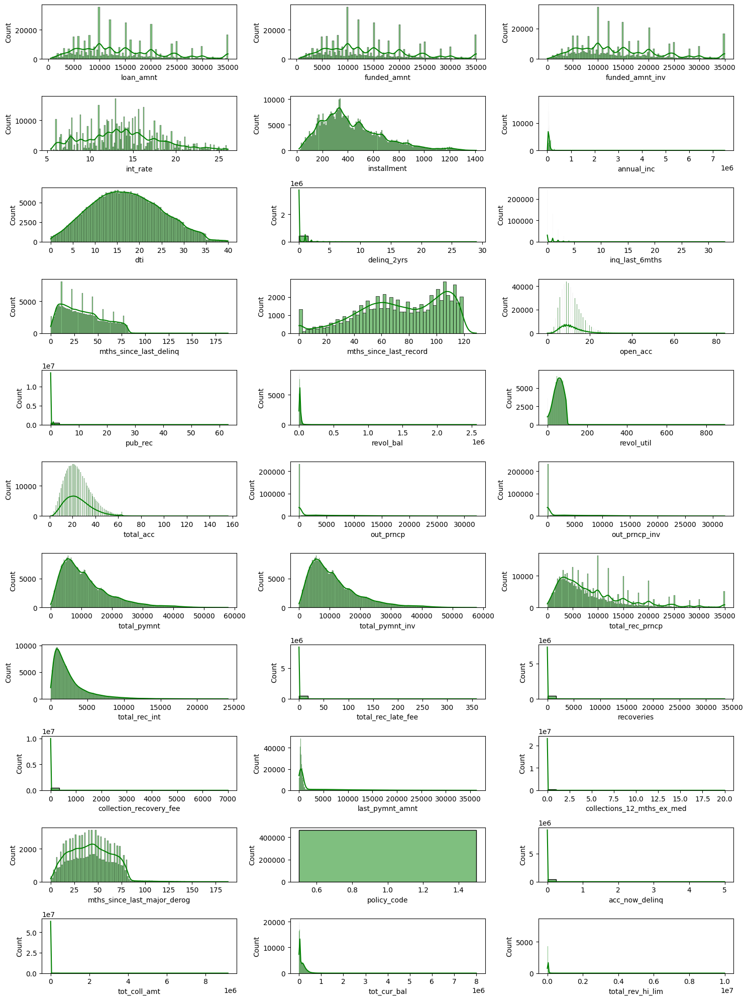

In [18]:
nums = ["loan_amnt","funded_amnt","funded_amnt_inv","int_rate","installment","annual_inc","dti","delinq_2yrs","inq_last_6mths","mths_since_last_delinq",
        "mths_since_last_record","open_acc","pub_rec","revol_bal","revol_util","total_acc","out_prncp","out_prncp_inv","total_pymnt","total_pymnt_inv",
        "total_rec_prncp","total_rec_int","total_rec_late_fee","recoveries","collection_recovery_fee","last_pymnt_amnt","collections_12_mths_ex_med",
        "mths_since_last_major_derog","policy_code","acc_now_delinq","tot_coll_amt","tot_cur_bal","total_rev_hi_lim"]
plt.figure(figsize=(15, 20))
for i in range(0, len(nums)):
    plt.subplot(11, 3, i+1)
    sns.histplot(df[nums[i]], color='green', kde=True)
    plt.tight_layout()

Berdasarkan visualisasi Hist Plots diatas : <br>
- `loan_amnt`,`funded_amnt`,`funded_amnt_inv`,`int_rate`, `dti`,`mths_since_last_record`,`total_rec_prncp` : **Bimodal**
- `installment`,`annual_inc`,`delinq_2yrs`,`inq_last_6mths`,`mths_since_last_delinq`,`open_acc`,`pub_rec`,`revol_bal`,`revol_util`,`total_acc`,`out_prncp`,`out_prncp_inv`,`total_pymnt`,`total_pymnt_inv`,`total_rec_int`,`total_rec_late_fee`,`recoveries`,`collection_recovery_fee`,`last_pymnt_amnt`,`collections_12_mths_ex_med`,`mths_since_last_major_derog`,`policy_code`,`acc_now_delinq`,`tot_coll_amt`,`tot_cur_bal`,`total_rev_hi_lim` : **positively skewed**


In [19]:
def percentages(col):
  x = df.groupby([col, 'label']).count().reset_index()
  x.columns = [col, 'label', 'count']
  x['total'] = x.groupby([col])[['count']].transform('sum')
  x['percentage'] = x['count'] / x['total'] * 100
  x.sort_values(['percentage'], ascending = False, inplace = True)
  x = x[x.label == 1]
  display(x)

In [20]:
#for i in [i for i in cats if i not in (['city'])]:
#percentages(i)

In [21]:
index_to_drop = 10
df_new = df.drop(index_to_drop)
df_new.head()

,Unnamed: 0,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,...,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,label
0,0,1077501,1296599,5000,5000,4975.0,36 months,10.65,162.87,B,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
1,1,1077430,1314167,2500,2500,2500.0,60 months,15.27,59.83,C,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
2,2,1077175,1313524,2400,2400,2400.0,36 months,15.96,84.33,C,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
3,3,1076863,1277178,10000,10000,10000.0,36 months,13.49,339.31,C,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
4,4,1075358,1311748,3000,3000,3000.0,60 months,12.69,67.79,B,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0


In [22]:
df['term'].value_counts()

 36 months    337953
 60 months    128332
Name: term, dtype: int64

In [23]:
df['grade'].value_counts()

B    136929
C    125293
D     76888
A     74867
E     35757
F     13229
G      3322
Name: grade, dtype: int64

In [24]:
df['sub_grade'].value_counts()

B3    31686
B4    30505
C1    26953
C2    26740
B2    26610
C3    25317
B5    25252
C4    24105
B1    22876
C5    22178
A5    21757
D1    19261
A4    19045
D2    17046
D3    14916
D4    14099
A3    12568
D5    11566
A2    10956
A1    10541
E1     9033
E2     8669
E3     6976
E4     5992
E5     5087
F1     3940
F2     3001
F3     2708
F4     2067
F5     1513
G1     1109
G2      823
G3      583
G4      422
G5      385
Name: sub_grade, dtype: int64

In [25]:
df['emp_title'].value_counts()

Teacher                              5399
Manager                              4438
Registered Nurse                     2316
RN                                   2204
Supervisor                           1967
                                     ... 
The Eastern Arizona AHEC                1
Delaware Quarries.com                   1
McCauley trucking and warehousing       1
save mart supermarkets                  1
Server Engineer Lead                    1
Name: emp_title, Length: 205475, dtype: int64

In [26]:
df['emp_length'].value_counts()

10+ years    150049
2 years       41373
3 years       36596
< 1 year      36265
5 years       30774
1 year        29622
4 years       28023
7 years       26180
6 years       26112
8 years       22395
9 years       17888
Name: emp_length, dtype: int64

In [27]:
df['home_ownership'].value_counts()

MORTGAGE    235875
RENT        188473
OWN          41704
OTHER          182
NONE            50
ANY              1
Name: home_ownership, dtype: int64

In [28]:
df['verification_status'].value_counts()

Verified           168055
Source Verified    149993
Not Verified       148237
Name: verification_status, dtype: int64

In [29]:
df['issue_d'].value_counts()

Oct-14    38782
Jul-14    29306
Nov-14    25054
May-14    19099
Apr-14    19071
          ...  
Aug-07       74
Jul-07       63
Sep-08       57
Sep-07       53
Jun-07       24
Name: issue_d, Length: 91, dtype: int64

In [30]:
df['pymnt_plan'].value_counts()

n    466276
y         9
Name: pymnt_plan, dtype: int64

In [31]:
df['url'].value_counts()

https://www.lendingclub.com/browse/loanDetail.action?loan_id=1077501     1
https://www.lendingclub.com/browse/loanDetail.action?loan_id=26180404    1
https://www.lendingclub.com/browse/loanDetail.action?loan_id=26219322    1
https://www.lendingclub.com/browse/loanDetail.action?loan_id=26239577    1
https://www.lendingclub.com/browse/loanDetail.action?loan_id=26290537    1
                                                                        ..
https://www.lendingclub.com/browse/loanDetail.action?loan_id=3714715     1
https://www.lendingclub.com/browse/loanDetail.action?loan_id=3703738     1
https://www.lendingclub.com/browse/loanDetail.action?loan_id=3731030     1
https://www.lendingclub.com/browse/loanDetail.action?loan_id=3705772     1
https://www.lendingclub.com/browse/loanDetail.action?loan_id=9199665     1
Name: url, Length: 466285, dtype: int64

In [32]:
df['desc'].value_counts()

                                                                                                                                                                                                                                                 234
Debt Consolidation                                                                                                                                                                                                                                13
  Borrower added on 03/17/14 > Debt consolidation<br>                                                                                                                                                                                             11
  Borrower added on 03/10/14 > Debt consolidation<br>                                                                                                                                                                                             10
  Borrower added on 

In [33]:
df['purpose'].value_counts()

debt_consolidation    274195
credit_card           104157
home_improvement       26537
other                  23690
major_purchase          9828
small_business          7013
car                     5397
medical                 4602
moving                  2994
vacation                2487
wedding                 2343
house                   2269
educational              422
renewable_energy         351
Name: purpose, dtype: int64

In [34]:
df['title'].value_counts()

Debt consolidation                   164075
Credit card refinancing               62275
Debt Consolidation                    15760
Home improvement                      14849
Other                                 12713
                                      ...  
Credit Card Clearance                     1
credit repayment                          1
medical bills/credit card payoff          1
One Time Only Relief!                     1
Paying off the car and some bills         1
Name: title, Length: 63099, dtype: int64

In [35]:
df['zip_code'].value_counts()

945xx    5304
112xx    5102
750xx    5013
606xx    4696
100xx    4391
         ... 
204xx       1
502xx       1
514xx       1
049xx       1
901xx       1
Name: zip_code, Length: 888, dtype: int64

In [36]:
df['addr_state'].value_counts()

CA    71450
NY    40242
TX    36439
FL    31637
IL    18612
NJ    18061
PA    16424
OH    15237
GA    14975
VA    14222
NC    12682
MI    11549
MA    11072
MD    10974
AZ    10712
WA    10517
CO     9739
MN     8158
MO     7508
CT     7204
IN     6525
NV     6519
TN     5984
OR     5949
WI     5911
AL     5853
SC     5583
LA     5489
KY     4438
KS     4190
OK     4117
AR     3488
UT     3428
NM     2588
HI     2487
WV     2412
NH     2232
RI     2050
DC     1426
MT     1396
DE     1272
AK     1251
MS     1226
WY     1128
SD      980
VT      905
IA       14
NE       14
ID       12
ME        4
Name: addr_state, dtype: int64

In [37]:
df['earliest_cr_line'].value_counts()

Oct-00    3674
Aug-00    3597
Aug-01    3455
Oct-99    3406
Oct-01    3329
          ... 
Jul-55       1
Feb-57       1
Oct-54       1
May-53       1
Nov-56       1
Name: earliest_cr_line, Length: 664, dtype: int64

In [38]:
df['initial_list_status'].value_counts()

f    303005
w    163280
Name: initial_list_status, dtype: int64

In [39]:
df['last_pymnt_d'].value_counts()

Jan-16    179620
Dec-15     62000
Jul-15     11703
Oct-15     11248
Sep-15     10204
           ...  
Jun-08        20
Mar-08        18
Jan-08        11
Feb-08         8
Dec-07         2
Name: last_pymnt_d, Length: 98, dtype: int64

In [40]:
df['next_pymnt_d'].value_counts()

Feb-16    208393
Jan-16     27922
Mar-11       107
Apr-11       101
Feb-11        91
           ...  
Oct-14         2
Feb-08         2
May-08         1
Mar-15         1
Dec-07         1
Name: next_pymnt_d, Length: 100, dtype: int64

In [41]:
df['last_credit_pull_d'].value_counts()

Jan-16    327699
Dec-15     13992
Nov-15      8384
Sep-15      8051
Oct-15      7957
           ...  
Nov-07         3
May-08         1
Jun-08         1
Jul-08         1
Jul-07         1
Name: last_credit_pull_d, Length: 103, dtype: int64

In [42]:
df['application_type'].value_counts()

INDIVIDUAL    466285
Name: application_type, dtype: int64

### Coutplot (Categorical)

In [43]:
cats = ["term","grade","sub_grade","emp_title","emp_length","home_ownership","verification_status","issue_d","loan_status","pymnt_plan","url","desc",
        "purpose","title","zip_code","addr_state","earliest_cr_line","initial_list_status","last_pymnt_d","next_pymnt_d","last_credit_pull_d",
        "application_type"]

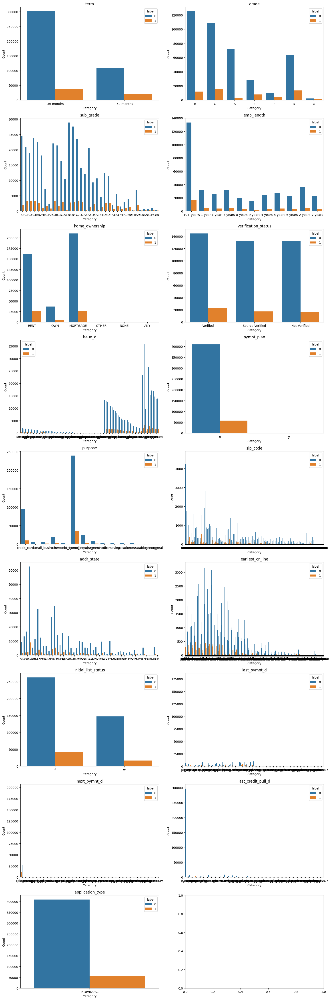

In [44]:
cats = ["term","grade","sub_grade","emp_length","home_ownership","verification_status","issue_d",
        "pymnt_plan","purpose","zip_code","addr_state","earliest_cr_line","initial_list_status","last_pymnt_d",
        "next_pymnt_d","last_credit_pull_d","application_type"]

feat_cat = cats
n = len(feat_cat)

rows = (n + 1) // 2
cols = 2

fig, ax = plt.subplots(rows, cols, figsize=(15, 5 * rows))

for i in range(n):
    row = i // 2
    col = i % 2
    sns.countplot(x=df[feat_cat[i]], hue = df['label'], ax=ax[row, col])
    ax[row, col].set_title(feat_cat[i])
    ax[row, col].set_xlabel("Category")
    ax[row, col].set_ylabel("Count")

plt.tight_layout()
plt.show()

Berdasarkan Visualisasi Countplot diatas :
1. `term` <br>
Berdasarkan Histogram, dalam waktu 36 months kandidat yang gagal bayar (target 1) memiliki nilai sebesar 30000, sedangkan dalam waktu 60 months kandidat yang gagal bayar (target 1) memiliki nilai 15000, artinya jumlah **term** untuk kandidat yang gagal bayar lebih dominan terjadi dalam waktu 36 months.
2. `grade` <br>
Berdasarkan Histogram, kandidat yang gagal bayar (target 1) memiliki nilai yang berbeda pada masing-masing **grade**, pada **grade A** sebesar 1000, **grade B** sebesar 10500, **grade C** sebesar 10900, **grade D** sebesar 10800, **grade E** sebesar 10000, **grade F** sebesar 5000, dan **grade G** sebesar 500. Artinya untuk nasabah yang gagal bayar dengan nilai terbesar berada di **grade C**, sedangkan yang paling kecil berada pada **grade G**.
3. `sub_grade`<br>
Berdasarkan Histogram, untuk masing-masing kandidat berada pada subgrade pinjaman masing-masing. Untuk nasabah gagal bayar (target 1) subgrade pinjaman tersebar terdapat pada golongan **subgrade C** seperti C1, C2, C3, C4, C5 dengan nilai sebesar 4000, dan yang paling kecil berada pada  golongan **subgrade A dan G** seperti A1, A2, A3, A4, A5, G1, G2, G3, G4, G5.
4. `emp_length` <br>
Berdasarkan Histogram, kandidat yang gagal bayar (target 1) terprediksi dengan nilai terbesar yaitu 19000 dalam lama waktu bekerja lebih dari 10 tahun. Sedangkan yang paling rendah dengan lama waktu bekerja 9 tahun dengan nilai sebesar 1000
5. `home_ownership` <br>
Berdasarkan Histogram diketahui untuk nasabah yang gagal bayar (target 1) status kepemilikan rumah **RENT / SEWA** sebesar 25000, **OWN / MILIK SENDIDRI** 5000, dan **MORTGAGE** sebesar 24000. Artinya untuk nasabah gagal bayar (target 1) status kepemilikan rumah pada saat melakukan pinjaman paling banyak **RENT / SEWA**.
6. `verification_status` <br>
Berdasarkan Histogram, verifikasi status peminjaman yang telah disetujui untuk nasabah gagal bayar (target 1) sebesar 20000, tidak diverifikasi sebesar 18000, dan sebagian diverifikasi sebesar 19000.
7. `pymnt_plan` <br>
Berdasarkan Histogram, status pembayaran nasabah pinjaman dengan pembayaran biasa untuk nasabah gagal bayar (target 1) sebesar 50000, dan pembayaran dicicil 0. Artinya tidak diberlakukan pembayaran dicicil untuk nsabah yang melakukan pinjaman
8. `purpose` <br>
Berdasarkan Histogram, tujuan peminjaman yang dilakukan nasabah masing-masing berbeda tujuan, tetapi tujuan nasabah yang paling banyak melakukan pinjaman adalah untuk **debt consolidation / konsilidasi hutang** begitu juga untuk nasabah gagal bayar (target 1) melakukan pinjaman dengan tujuan paling banayk untuk **debt consolidation / konsilidasi hutang** dengan nilai sebesar 40000.
9. `addr_state` <br>
Berdasarkan Histogram, nasabah yang melakukan pinjaman terbanyak berasal dari negara dengan kode negara CA, begitupun juga untuk nasabah gagal bayar (target 1) terbanyak berasal dari negara dengan kode negara CA sebesar 9000.
10. `earliest_cr_line` <br>
Berdasarkan Histogram, kredit bulan awal nasabah terbesar pada bulan oct_00 sebesar 3674.
11. `initial_list_status` <br>
Berdasarkan Histogram, status daftar awal pinjaman nasabah terbanyak pada kategori utuh (**fully funded**), begitupun juga duntuk nasabah gagal bayar (target 1) status daftar awal pinjaman nasabah terbanyak pada kategori utuh (**fully funded**) sebesar 40000, sedangkan dengan kategori **Not Yet Fully Funded** sebesar 24000.
12. `application_type` <br>
Berdasarkan Histogram, diketahui peminjaman dilakukan untuk atas kepemilikan individual bukan kelompok. Sehingga untuk nasabah gagal bayar (target 1) diketahui juga status kepemilikan yang dilakukan untuk individual bukan kelompok dengan nilai sebesar 50000. Tidak ditemukan peminjaman dengan status kepemilikan untuk kelompok.

# **Multivariate Analysis**

Setelah menilik setiap kolom secara individual, sekarang kita akan melihat hubungan antar kolom. Mengetahui hubungan antar kolom dapat membantu kita memilih fitur-fitur yang paling penting dan mengesampingkan *feature* yang redundan.

<ipython-input-45-ac086e6d040e>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(), annot=True, fmt='.2f')


<Axes: >

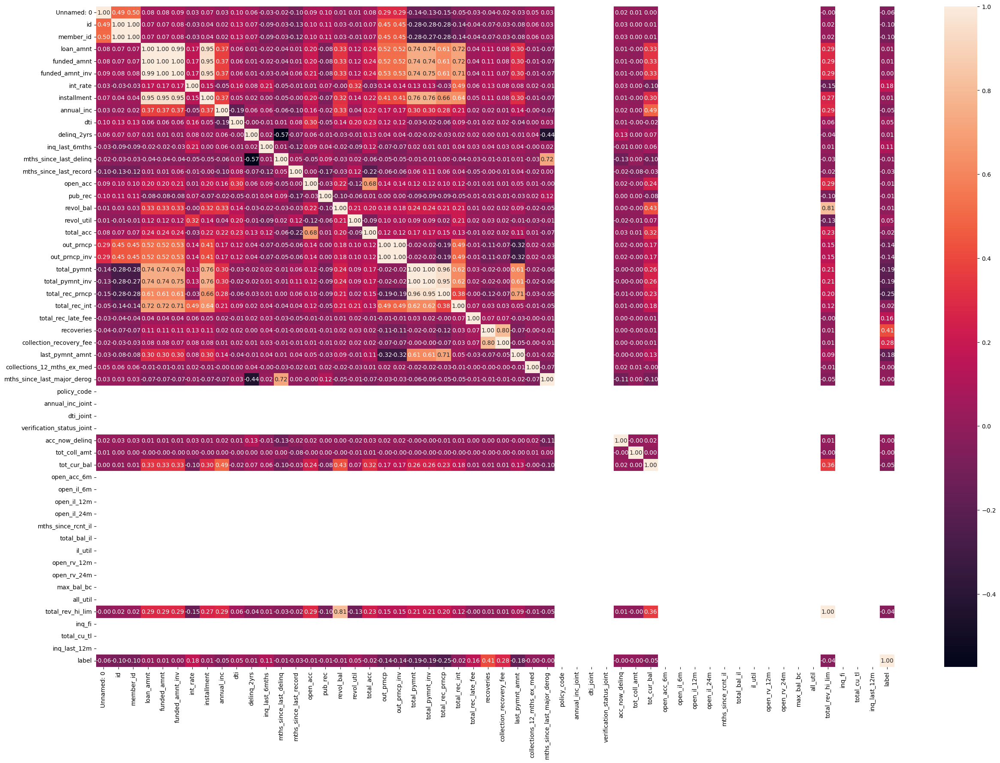

In [45]:
plt.figure(figsize=(30, 20))
sns.heatmap(df.corr(), annot=True, fmt='.2f')

Dari visualisasi diatas :
- Dari grafik heatmap diatas dapat dilihat korelasi antara feature dan target, berdasarkan grafik diatas diketahui korelasi target yang paling tinggi adalah dengan feature **int_rate** sekitar -0.15,- yang artinya berkorelasi negatif.

 # **Data Preprocessing**

In [46]:
df_new = df.copy()

In [47]:
df_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 466285 entries, 0 to 466284
Data columns (total 76 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   Unnamed: 0                   466285 non-null  int64  
 1   id                           466285 non-null  int64  
 2   member_id                    466285 non-null  int64  
 3   loan_amnt                    466285 non-null  int64  
 4   funded_amnt                  466285 non-null  int64  
 5   funded_amnt_inv              466285 non-null  float64
 6   term                         466285 non-null  object 
 7   int_rate                     466285 non-null  float64
 8   installment                  466285 non-null  float64
 9   grade                        466285 non-null  object 
 10  sub_grade                    466285 non-null  object 
 11  emp_title                    438697 non-null  object 
 12  emp_length                   445277 non-null  object 
 13 

### Handling Missing Value
Mengisi fitur yang kosong, tetapi untuk fitur yang tidak ada nilainya sama sekali nanti akan dilakukan **Drop**

In [48]:
df_new.isna().sum()

Unnamed: 0               0
id                       0
member_id                0
loan_amnt                0
funded_amnt              0
                     ...  
total_rev_hi_lim     70276
inq_fi              466285
total_cu_tl         466285
inq_last_12m        466285
label                    0
Length: 76, dtype: int64

In [49]:
df_new['annual_inc'].fillna(df_new['annual_inc'].mean(), inplace=True)
df_new['emp_title'].fillna(df_new['emp_title'].mode()[0], inplace=True)
df_new['emp_length'].fillna(df_new['emp_length'].mode()[0], inplace=True)
df_new['desc'].fillna(df_new['desc'].mode()[0], inplace=True)
df_new['title'] = df_new['title'].fillna('Other')
df_new['delinq_2yrs'].fillna(df_new['delinq_2yrs'].mean(), inplace=True)
df_new['earliest_cr_line'].fillna(df_new['earliest_cr_line'].mode()[0], inplace=True)
df_new['inq_last_6mths'].fillna(df_new['inq_last_6mths'].mode()[0], inplace=True)
df_new['mths_since_last_delinq'].fillna(df_new['mths_since_last_delinq'].mean(), inplace=True)
df_new['mths_since_last_record'].fillna(df_new['mths_since_last_record'].mean(), inplace=True)
df_new['open_acc'].fillna(df_new['open_acc'].mean(), inplace=True)
df_new['pub_rec'].fillna(df_new['pub_rec'].mode()[0], inplace=True)
df_new['revol_util'].fillna(df_new['revol_util'].mean(), inplace=True)
df_new['total_acc'].fillna(df_new['total_acc'].mean(), inplace=True)
df_new['last_pymnt_d'].fillna(df_new['last_pymnt_d'].mode()[0], inplace=True)
df_new['next_pymnt_d'].fillna(df_new['next_pymnt_d'].mode()[0], inplace=True)
df_new['last_credit_pull_d'].fillna(df_new['last_credit_pull_d'].mode()[0], inplace=True)
df_new['collections_12_mths_ex_med'].fillna(df_new['collections_12_mths_ex_med'].mode()[0], inplace=True)
df_new['mths_since_last_major_derog'].fillna(df_new['mths_since_last_major_derog'].mean(), inplace=True)
df_new['acc_now_delinq'].fillna(df_new['acc_now_delinq'].mode()[0], inplace=True)
df_new['tot_coll_amt'].fillna(df_new['tot_coll_amt'].mean(), inplace=True)
df_new['tot_cur_bal'].fillna(df_new['tot_cur_bal'].mean(), inplace=True)
df_new['total_rev_hi_lim'].fillna(df_new['total_rev_hi_lim'].mean(), inplace=True)


In [50]:
df_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 466285 entries, 0 to 466284
Data columns (total 76 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   Unnamed: 0                   466285 non-null  int64  
 1   id                           466285 non-null  int64  
 2   member_id                    466285 non-null  int64  
 3   loan_amnt                    466285 non-null  int64  
 4   funded_amnt                  466285 non-null  int64  
 5   funded_amnt_inv              466285 non-null  float64
 6   term                         466285 non-null  object 
 7   int_rate                     466285 non-null  float64
 8   installment                  466285 non-null  float64
 9   grade                        466285 non-null  object 
 10  sub_grade                    466285 non-null  object 
 11  emp_title                    466285 non-null  object 
 12  emp_length                   466285 non-null  object 
 13 

### Handling Duplicated Data

In [51]:
df_new.duplicated().sum()

0

In [52]:
df_new.duplicated(subset=["id"]).sum()

0

### Handling Invalid Values

In [53]:
df_new.isnull().sum()

Unnamed: 0               0
id                       0
member_id                0
loan_amnt                0
funded_amnt              0
                     ...  
total_rev_hi_lim         0
inq_fi              466285
total_cu_tl         466285
inq_last_12m        466285
label                    0
Length: 76, dtype: int64

### Feature Extraction (Feature Engineering)

#### ***Membuat kolom* `initial_status`**
Agar mudah diketahui bahwa nilai **f = Fully Funded** dan **w = Not yet fully funded**

In [54]:
print(df_new["initial_list_status"].value_counts())

f    303005
w    163280
Name: initial_list_status, dtype: int64


In [55]:
def status(funding):
    if funding == 'f':
        return 'fully funded'
    else:
        return 'not yet fully funded'

df_new['initial_list'] = df_new['initial_list_status'].apply(status)

print(df_new['initial_list'].value_counts())

fully funded            303005
not yet fully funded    163280
Name: initial_list, dtype: int64


#### ***Membuat kolom* `plan_payment`**
Agar mudah diketahui bahwa nilai **n = Not an installment plan** dan **y = Is an installment plan**

In [56]:
print(df_new["pymnt_plan"].value_counts())

n    466276
y         9
Name: pymnt_plan, dtype: int64


In [57]:
def riwayat(funding):
    if funding == 'n':
        return 'Not an installment plan'
    else:
        return 'Is an installment plan'

df_new['plan_payment'] = df_new['pymnt_plan'].apply(riwayat)

print(df_new['plan_payment'].value_counts())

Not an installment plan    466276
Is an installment plan          9
Name: plan_payment, dtype: int64


In [58]:
df_new.sample(5)

,Unnamed: 0,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,...,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,label,initial_list,plan_payment
155716,155716,3725956,4718267,10000,10000,10000.0,36 months,13.11,337.47,B,...,NaN,NaN,NaN,23226.000000,NaN,NaN,NaN,0,fully funded,Not an installment plan
419402,419402,12266619,14258756,18425,18425,18425.0,60 months,18.92,477.15,D,...,NaN,NaN,NaN,25900.000000,NaN,NaN,NaN,0,not yet fully funded,Not an installment plan
9876,9876,836587,1046651,12000,12000,12000.0,36 months,13.99,410.08,C,...,NaN,NaN,NaN,30379.087771,NaN,NaN,NaN,0,fully funded,Not an installment plan
339506,339506,22331771,24654702,5000,5000,5000.0,36 months,12.49,167.25,B,...,NaN,NaN,NaN,13500.000000,NaN,NaN,NaN,0,not yet fully funded,Not an installment plan
352932,352932,20778793,23051580,12575,12575,12575.0,36 months,15.61,439.69,D,...,NaN,NaN,NaN,36300.000000,NaN,NaN,NaN,0,fully funded,Not an installment plan


### Feature Selection (Feature Engineering)

#### ***Merubah nilai pada feature* `emp_length` seperti 5 years -> 5**

In [59]:
df_new['emp_length'].unique()

array(['10+ years', '< 1 year', '1 year', '3 years', '8 years', '9 years',
       '4 years', '5 years', '6 years', '2 years', '7 years'],
      dtype=object)

In [60]:
df_new['emp_length_int'] = df_new['emp_length'].str.replace('\+ years', '')
df_new['emp_length_int'] = df_new['emp_length_int'].str.replace('< 1 year', str(0))
df_new['emp_length_int'] = df_new['emp_length_int'].str.replace('years', '')
df_new['emp_length_int'] = df_new['emp_length_int'].str.replace('year', '')

<ipython-input-60-f96ba7a99532>:1: FutureWarning: The default value of regex will change from True to False in a future version.
  df_new['emp_length_int'] = df_new['emp_length'].str.replace('\+ years', '')


**Merubah type data `emp_length_int` menjadi float**

In [61]:
df_new['emp_length_int'] = df_new['emp_length_int'].astype(float)

**Drop feature `emp_length` yang sudah tidak digunakan**

In [62]:
df_new.drop('emp_length', axis=1, inplace=True)

#### ***Merubah nilai pada feature* `term` seperti 36 months -> 36**

In [63]:
df_new['term'].unique()

array([' 36 months', ' 60 months'], dtype=object)

In [64]:
df_new['term_int'] = df_new['term'].str.replace(' months', '')

**Merubah type data `term_int` menjadi float**

In [65]:
df_new['term_int'] = df_new['term_int'].astype(float)

**Drop feature `term` yang sudah tidak digunakan**

In [66]:
df_new.drop('term', axis=1, inplace=True)

#### ***Merubah nilai pada feature* `earliest_cr_line` seperti Jan-85 -> 1985-01-01**
Memodifikasi `earliest_cr_line` dari format bulan-tahun menjadi perhitungan berapa lama waktu berlalu sejak waktu tersebut. Untuk melakukan hal ini, umumnya digunakan reference date = hari ini. Namun, karena dataset ini merupakan dataset tahun 2007-2014, maka akan lebih relevan jika menggunakan reference date di sekitar tahun 2017. Dalam contoh ini, saya menggunakan tanggal 2017-12-01 sebagai reference date.

In [67]:
df_new['earliest_cr_line'].head()

0    Jan-85
1    Apr-99
2    Nov-01
3    Feb-96
4    Jan-96
Name: earliest_cr_line, dtype: object

In [68]:
df_new['earliest_cr_line_date'] = pd.to_datetime(df_new['earliest_cr_line'], format='%b-%y')
df_new['earliest_cr_line_date'].head()

0   1985-01-01
1   1999-04-01
2   2001-11-01
3   1996-02-01
4   1996-01-01
Name: earliest_cr_line_date, dtype: datetime64[ns]

#### ***Membuat kolom `mths_since_earliest_cr_line` yang mendefenisikan berapa lama waktu berlalu mulai dari awal hingga tahun 2017-12-01***

In [69]:
df_new['mths_since_earliest_cr_line'] = round(pd.to_numeric((pd.to_datetime('2017-12-01') - df_new['earliest_cr_line_date']) / np.timedelta64(1, 'M')))
df_new['mths_since_earliest_cr_line'].head(3)

0    395.0
1    224.0
2    193.0
Name: mths_since_earliest_cr_line, dtype: float64

In [70]:
df_new['mths_since_earliest_cr_line'].describe()

count    466285.000000
mean        239.480348
std          93.972277
min        -612.000000
25%         183.000000
50%         225.000000
75%         285.000000
max         587.000000
Name: mths_since_earliest_cr_line, dtype: float64

Terlihat ada nilai yang aneh, yaitu negatif

#### ***Melihat isi pada tabel***

In [71]:
df_new[df_new['mths_since_earliest_cr_line']<0][['earliest_cr_line', 'earliest_cr_line_date', 'mths_since_earliest_cr_line']].head(3)

,earliest_cr_line,earliest_cr_line_date,mths_since_earliest_cr_line
1580,Sep-62,2062-09-01,-537.0
1770,Sep-68,2068-09-01,-609.0
2799,Sep-64,2064-09-01,-561.0


Ternyata nilai negatif muncul karena fungsi Python salah menginterpretasikan tahun 62 menjadi tahun 2062, padahal seharusnya merupakan tahun 1962.

Untuk mengatasi hal ini, dapat dilakukan preprocessing lebih jauh jika ingin membenarkan tahun 2062 menjadi 1962. Namun, kali ini saya hanya mengubah nilai yang negatif menjadi nilai maximum dari fitur tersebut. Karena di sini saya mengetahui bahwa nilai-nilai yang negatif artinya adalah data yang sudah tua (tahun 1900an), maka masih masuk akal jika saya mengganti nilai-nilai tersebut menjadi nilai terbesar.

#### ***Merubah nilai yang negatif menjadi positif dengan cara merubah menjadi nilai max***

In [72]:
df_new.loc[df_new['mths_since_earliest_cr_line']<0, 'mths_since_earliest_cr_line'] = df_new['mths_since_earliest_cr_line'].max()

In [73]:
df_new['mths_since_earliest_cr_line'].describe()

count    466285.000000
mean        242.383111
std          86.458098
min          73.000000
25%         184.000000
50%         226.000000
75%         285.000000
max         587.000000
Name: mths_since_earliest_cr_line, dtype: float64

Sudah tidak ditemukan nilai negatif

#### ***Drop feature `earliest_cr_line` dan `earliest_cr_line_date` yang sudah tidak digunakan***



In [74]:
df_new.drop(['earliest_cr_line','earliest_cr_line_date'], axis=1, inplace=True)

#### ***Preprocessing yang dilakukan `issue_d` sama dengan yang dilakukan terhadap variabel earliest_cr_line***

#### ***Merubah nilai pada feature `issue_d` seperti Des-11 -> 2011-12-01***

In [75]:
df_new['issue_d'].head()

0    Dec-11
1    Dec-11
2    Dec-11
3    Dec-11
4    Dec-11
Name: issue_d, dtype: object

In [76]:
df_new['issue_d_date'] = pd.to_datetime(df_new['issue_d'], format='%b-%y')
df_new['issue_d_date'].head()

0   2011-12-01
1   2011-12-01
2   2011-12-01
3   2011-12-01
4   2011-12-01
Name: issue_d_date, dtype: datetime64[ns]

#### ***Membuat kolom `mths_since_issue_d` yang mendefenisikan berapa lama waktu berlalu mulai dari awal hingga tahun 2017-12-01***

In [77]:
df_new['mths_since_issue_d'] = round(pd.to_numeric((pd.to_datetime('2017-12-01') - df_new['issue_d_date']) / np.timedelta64(1, 'M')))
df_new['mths_since_issue_d'].head(3)

0    72.0
1    72.0
2    72.0
Name: mths_since_issue_d, dtype: float64

In [78]:
df_new['mths_since_issue_d'].describe()

count    466285.000000
mean         51.255187
std          14.340154
min          36.000000
25%          41.000000
50%          47.000000
75%          57.000000
max         126.000000
Name: mths_since_issue_d, dtype: float64

Tidak terdapat nilai negatif

***Drop feature `issue_d`, `issue_d_date` yang sudah tidak digunakan***

In [79]:
df_new.drop(['issue_d','issue_d_date'], axis=1, inplace=True)

#### ***Preprocessing yang dilakukan `last_pymnt_d` sama dengan yang dilakukan terhadap variabel earliest_cr_line***

#### ***Merubah nilai pada feature* `last_pymnt_d` seperti Jan-15 -> 2015-01-01**

In [80]:
df_new['last_pymnt_d'].head()

0    Jan-15
1    Apr-13
2    Jun-14
3    Jan-15
4    Jan-16
Name: last_pymnt_d, dtype: object

In [81]:
df_new['last_pymnt_d_date'] = pd.to_datetime(df_new['last_pymnt_d'], format='%b-%y')
df_new['last_pymnt_d_date'].head()

0   2015-01-01
1   2013-04-01
2   2014-06-01
3   2015-01-01
4   2016-01-01
Name: last_pymnt_d_date, dtype: datetime64[ns]

#### ***Membuat kolom `mths_since_last_pymnt_d` yang mendefenisikan berapa lama waktu berlalu mulai dari awal hingga tahun 2017-12-01***

In [82]:
df_new['mths_since_last_pymnt_d'] = round(pd.to_numeric((pd.to_datetime('2017-12-01') - df_new['last_pymnt_d_date']) / np.timedelta64(1, 'M')))
df_new['mths_since_last_pymnt_d'].head(3)

0    35.0
1    56.0
2    42.0
Name: mths_since_last_pymnt_d, dtype: float64

In [83]:
df_new['mths_since_last_pymnt_d'].describe()

count    466285.000000
mean         31.287680
std          12.806897
min          23.000000
25%          23.000000
50%          24.000000
75%          35.000000
max         120.000000
Name: mths_since_last_pymnt_d, dtype: float64

Tidak terdapat nilai negatif

**Drop feature `last_pymnt_d` dan `last_pymnt_d_date` yang sudah tidak digunakan**

In [84]:
df_new.drop(['last_pymnt_d', 'last_pymnt_d_date'], axis=1, inplace=True)

#### ***Preprocessing yang dilakukan `next_pymnt_d` sama dengan yang dilakukan terhadap variabel earliest_cr_line***

#### ***Merubah nilai pada feature* `next_pymnt_d` seperti Feb-16 -> 2016-02-01**

In [85]:
df_new['next_pymnt_d'].head()

0    Feb-16
1    Feb-16
2    Feb-16
3    Feb-16
4    Feb-16
Name: next_pymnt_d, dtype: object

In [86]:
df_new['next_pymnt_d_date'] = pd.to_datetime(df_new['next_pymnt_d'], format='%b-%y')
df_new['next_pymnt_d_date'].head()

0   2016-02-01
1   2016-02-01
2   2016-02-01
3   2016-02-01
4   2016-02-01
Name: next_pymnt_d_date, dtype: datetime64[ns]

#### ***Membuat kolom `mths_since_next_pymnt_d` yang mendefenisikan berapa lama waktu berlalu mulai dari awal hingga tahun 2017-12-01***

In [87]:
df_new['mths_since_next_pymnt_d'] = round(pd.to_numeric((pd.to_datetime('2017-12-01') - df_new['next_pymnt_d_date']) / np.timedelta64(1, 'M')))
df_new['mths_since_next_pymnt_d'].describe()

count    466285.000000
mean         22.378453
std           4.370769
min          21.000000
25%          22.000000
50%          22.000000
75%          22.000000
max         120.000000
Name: mths_since_next_pymnt_d, dtype: float64

Tidak terdapat nilai negatif

**Drop feature `next_pymnt_d` dan 'next_pymnt_d_date' yang sudah tidak digunakan**





In [88]:
df_new.drop(['next_pymnt_d','next_pymnt_d_date'], axis=1, inplace=True)

#### ***Preprocessing yang dilakukan `last_credit_pull_d` sama dengan yang dilakukan terhadap variabel earliest_cr_line***

#### ***Merubah nilai pada feature* `last_credit_pull_d` seperti Jan-16 -> 2016-01-01**

In [89]:
df_new['last_credit_pull_d'].head()

0    Jan-16
1    Sep-13
2    Jan-16
3    Jan-15
4    Jan-16
Name: last_credit_pull_d, dtype: object

In [90]:
df_new['last_credit_pull_d_date'] = pd.to_datetime(df_new['last_credit_pull_d'], format='%b-%y')
df_new['last_credit_pull_d_date'].head()

0   2016-01-01
1   2013-09-01
2   2016-01-01
3   2015-01-01
4   2016-01-01
Name: last_credit_pull_d_date, dtype: datetime64[ns]

#### ***Membuat kolom `mths_since_last_credit_pull_d` yang mendefenisikan berapa lama waktu berlalu mulai dari awal hingga tahun 2017-12-01***

In [91]:
df_new['mths_since_last_credit_pull_d'] = round(pd.to_numeric((pd.to_datetime('2017-12-01') - df_new['last_credit_pull_d_date']) / np.timedelta64(1, 'M')))
df_new['mths_since_last_credit_pull_d'].head(3)

0    23.0
1    51.0
2    23.0
Name: mths_since_last_credit_pull_d, dtype: float64

In [92]:
df_new['mths_since_last_credit_pull_d'].describe()

count    466285.000000
mean         27.045223
std           9.636066
min          23.000000
25%          23.000000
50%          23.000000
75%          25.000000
max         127.000000
Name: mths_since_last_credit_pull_d, dtype: float64

Tidak ada nilai negatif

**Drop feature `last_credit_pull_d` dan 'last_credit_pull_d_date' yang sudah tidak digunakan**



In [93]:
df_new.drop(['last_credit_pull_d','last_credit_pull_d_date'], axis=1, inplace=True)

#### ***Mengecek nilai unique pada type data object***


In [94]:
df_new.select_dtypes(include='object').nunique()

grade                       7
sub_grade                  35
emp_title              205475
home_ownership              6
verification_status         3
loan_status                 9
pymnt_plan                  2
url                    466285
desc                   124436
purpose                    14
title                   63099
zip_code                  888
addr_state                 50
initial_list_status         2
application_type            1
initial_list                2
plan_payment                2
dtype: int64

Pada tahap ini dilakukan pembuangan fitur yang memiliki nilai unik yang sangat tinggi (high cardinality) dan fitur yang hanya memiliki 1 nilai unik saja

In [95]:
df_new.drop(['emp_title','url','desc','title','application_type','zip_code'], axis=1, inplace=True)

#### ***Mengecek nilai unique pada type data selain object***

In [96]:
df_new.select_dtypes(exclude='object').nunique()

Unnamed: 0                       466285
id                               466285
member_id                        466285
loan_amnt                          1352
funded_amnt                        1354
                                  ...  
mths_since_earliest_cr_line         515
mths_since_issue_d                   91
mths_since_last_pymnt_d              98
mths_since_next_pymnt_d             100
mths_since_last_credit_pull_d       103
Length: 61, dtype: int64

Ternyata, pada tipe data selain object juga terdapat fitur yang hanya memiliki satu nilai unik saja, maka akan ikut dibuang juga. Sedangkan nilai unique yang lain tetap tidak di **Drop** meskipun memiliki nilai unique yang banyak karena dia bertype data numeric

In [97]:
df_new['policy_code'].nunique()

1

In [98]:
df_new.drop(['policy_code'], axis=1, inplace=True)

#### ***Drop Features Unnamed:0, id dan member_id karena merupakan nilai unique***

In [99]:
df_new.drop(["Unnamed: 0","id","member_id"],axis=1, inplace=True)

#### ***Drop Features yang tidak memiliki nilai sama sekali***
- `annual_inc_joint`, `dti_joint`,`verification_status_joint`,`open_acc_6m`,`open_il_6m`,`open_il_12m`,`open_il_24m`,`mths_since_rcnt_il`,`total_bal_il`,`il_util`,`open_rv_12m`,`open_rv_24m`,`max_bal_bc`,`all_util`,`inq_fi`,`total_cu_tl`,`inq_last_12m`.


In [100]:
df_new.drop(["annual_inc_joint", "dti_joint","verification_status_joint",
             "open_acc_6m","open_il_6m","open_il_12m","open_il_24m","mths_since_rcnt_il",
             "total_bal_il","il_util","open_rv_12m","open_rv_24m","max_bal_bc","all_util",
             "inq_fi","total_cu_tl","inq_last_12m"],axis=1, inplace=True)

#### ***Drop Feature karena data telah didefenisikan sebelumnya***
- `pymnt_plan`, `initial_list_status`, `loan_status`



In [101]:
df_new.drop(["pymnt_plan", "initial_list_status", "loan_status"],axis=1, inplace=True)

In [102]:
df_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 466285 entries, 0 to 466284
Data columns (total 48 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   loan_amnt                      466285 non-null  int64  
 1   funded_amnt                    466285 non-null  int64  
 2   funded_amnt_inv                466285 non-null  float64
 3   int_rate                       466285 non-null  float64
 4   installment                    466285 non-null  float64
 5   grade                          466285 non-null  object 
 6   sub_grade                      466285 non-null  object 
 7   home_ownership                 466285 non-null  object 
 8   annual_inc                     466285 non-null  float64
 9   verification_status            466285 non-null  object 
 10  purpose                        466285 non-null  object 
 11  addr_state                     466285 non-null  object 
 12  dti                           

### Handling Outliers (Numeric)





### ***z-score***

In [103]:
df_zscore = df_new.copy()

In [104]:
#from scipy import stats
#print(f'Jumlah baris sebelum memfilter outlier: {len(df_zscore)}')

#filtered_entries = np.array([True] * len(df_zscore))

#for col in ["loan_amnt","funded_amnt","funded_amnt_inv","int_rate","installment","annual_inc","dti","delinq_2yrs","inq_last_6mths","mths_since_last_delinq",
        #"mths_since_last_record","open_acc","pub_rec","revol_bal","revol_util","total_acc","out_prncp","out_prncp_inv","total_pymnt","total_pymnt_inv",
        #"total_rec_prncp","total_rec_int","total_rec_late_fee","recoveries","collection_recovery_fee","last_pymnt_amnt","collections_12_mths_ex_med",
        #"mths_since_last_major_derog","policy_code","acc_now_delinq","tot_coll_amt","tot_cur_bal","total_rev_hi_lim"]:
    #zscore = abs(stats.zscore(df[col])) # hitung absolute z-scorenya
    #filtered_entries = (zscore < 3) & filtered_entries # keep yang kurang dari 3 absolute z-scorenya

#df_zscore = df_zscore[filtered_entries] # filter, cuma ambil yang z-scorenya dibawah 3

#print(f'Jumlah baris setelah memfilter outlier: {len(df_zscore)}')

### ***IQR***

In [105]:
df_iqr = df_new.copy()

In [106]:
print(f'Jumlah baris sebelum memfilter outlier: {len(df_iqr)}')

filtered_entries = np.array([True] * len(df_iqr))
for col in ["loan_amnt","funded_amnt","funded_amnt_inv","int_rate","installment","annual_inc","dti","delinq_2yrs",
            "inq_last_6mths","mths_since_last_delinq","mths_since_last_record","open_acc","pub_rec","revol_bal",
            "revol_util","total_acc","out_prncp","out_prncp_inv","total_pymnt","total_pymnt_inv","total_rec_prncp",
            "total_rec_int","total_rec_late_fee","recoveries","collection_recovery_fee","last_pymnt_amnt",
            "collections_12_mths_ex_med","mths_since_last_major_derog","acc_now_delinq","tot_coll_amt","tot_cur_bal",
            "total_rev_hi_lim",'emp_length_int','term_int','mths_since_earliest_cr_line','mths_since_issue_d',
            'mths_since_last_pymnt_d','mths_since_next_pymnt_d','mths_since_last_credit_pull_d']:
    Q1 = df_iqr[col].quantile(0.25)
    Q3 = df_iqr[col].quantile(0.75)
    IQR = Q3 - Q1
    low_limit = Q1 - (IQR * 1.5)
    high_limit = Q3 + (IQR * 1.5)

    filtered_entries = ((df_iqr[col] >= low_limit) & (df_iqr[col] <= high_limit)) & filtered_entries

df_iqr = df_iqr[filtered_entries]

print(f'Jumlah baris setelah memfilter outlier: {len(df_iqr)}')

Jumlah baris sebelum memfilter outlier: 466285
Jumlah baris setelah memfilter outlier: 74152


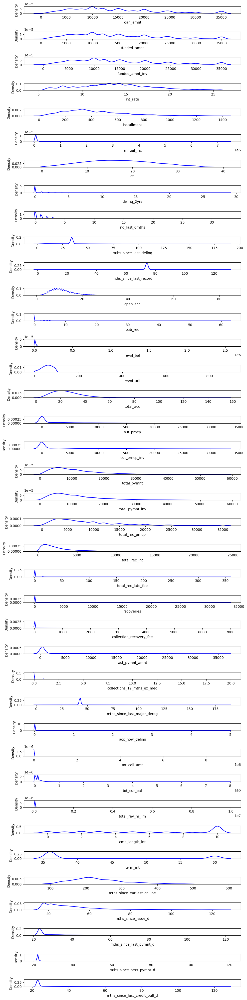

In [107]:
#df_new (before IQR)
num = ["loan_amnt","funded_amnt","funded_amnt_inv","int_rate","installment","annual_inc","dti","delinq_2yrs",
       "inq_last_6mths","mths_since_last_delinq","mths_since_last_record","open_acc","pub_rec","revol_bal",
       "revol_util","total_acc","out_prncp","out_prncp_inv","total_pymnt","total_pymnt_inv","total_rec_prncp",
       "total_rec_int","total_rec_late_fee","recoveries","collection_recovery_fee","last_pymnt_amnt",
       "collections_12_mths_ex_med","mths_since_last_major_derog","acc_now_delinq","tot_coll_amt","tot_cur_bal",
       "total_rev_hi_lim",'emp_length_int','term_int','mths_since_earliest_cr_line','mths_since_issue_d',
            'mths_since_last_pymnt_d','mths_since_next_pymnt_d','mths_since_last_credit_pull_d']
fig = plt.figure(figsize=(10, 40))
for i in range(0, len(num)):
    plt.subplot(39,1, i+1)
    sns.kdeplot(x = df_new[num[i]], color='blue')
    plt.xlabel(num[i])

plt.tight_layout()

<ipython-input-108-9c5fc93c0f3f>:13: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(x = df_iqr[num[i]], color='blue')
<ipython-input-108-9c5fc93c0f3f>:13: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(x = df_iqr[num[i]], color='blue')
<ipython-input-108-9c5fc93c0f3f>:13: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(x = df_iqr[num[i]], color='blue')
<ipython-input-108-9c5fc93c0f3f>:13: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(x = df_iqr[num[i]], color='blue')
<ipython-input-108-9c5fc93c0f3f>:13: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(x = df_iqr[num[i]], color='bl

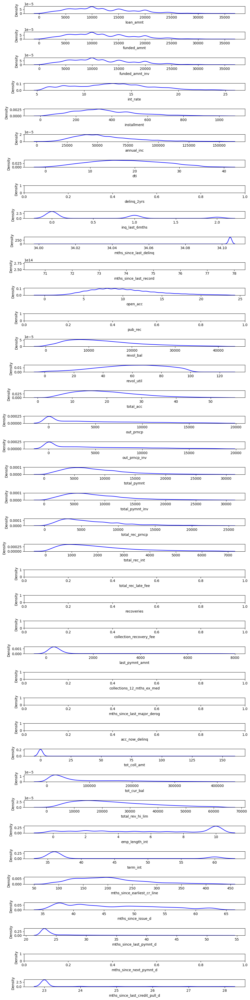

In [108]:
# df_iqr (after IQR)
num = ["loan_amnt","funded_amnt","funded_amnt_inv","int_rate","installment","annual_inc","dti","delinq_2yrs",
       "inq_last_6mths","mths_since_last_delinq","mths_since_last_record","open_acc","pub_rec","revol_bal",
       "revol_util","total_acc","out_prncp","out_prncp_inv","total_pymnt","total_pymnt_inv","total_rec_prncp",
       "total_rec_int","total_rec_late_fee","recoveries","collection_recovery_fee","last_pymnt_amnt",
       "collections_12_mths_ex_med","mths_since_last_major_derog","acc_now_delinq","tot_coll_amt","tot_cur_bal",
       "total_rev_hi_lim",'emp_length_int','term_int','mths_since_earliest_cr_line','mths_since_issue_d',
            'mths_since_last_pymnt_d','mths_since_next_pymnt_d','mths_since_last_credit_pull_d']

fig = plt.figure(figsize=(10, 40))
for i in range(0, len(num)):
    plt.subplot(39,1, i+1)
    sns.kdeplot(x = df_iqr[num[i]], color='blue')
    plt.xlabel(num[i])

plt.tight_layout()

### Feature Transformation (Numeric)

Skewed distribution =  MinMaxScaler <br/>
Normal distribution = StandardScaler <br/>
 <br/>
**Note:** <br/>
Tidak boleh menggunakan keduanya secara bersamaan.
<br/>


Karena data berdistribusi skewed, maka sebaiknya menggunakan normalisasi

In [109]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler

df_iqr['loan_amnt_norm'] = MinMaxScaler().fit_transform(df_iqr['loan_amnt'].values.reshape(len(df_iqr), 1))
df_iqr['funded_amnt_norm'] = MinMaxScaler().fit_transform(df_iqr['funded_amnt'].values.reshape(len(df_iqr), 1))
df_iqr['funded_amnt_inv_norm'] = MinMaxScaler().fit_transform(df_iqr['funded_amnt_inv'].values.reshape(len(df_iqr), 1))
df_iqr['int_rate_norm'] = MinMaxScaler().fit_transform(df_iqr['int_rate'].values.reshape(len(df_iqr), 1))
df_iqr['installment_norm'] = MinMaxScaler().fit_transform(df_iqr['installment'].values.reshape(len(df_iqr), 1))
df_iqr['annual_inc_norm'] = MinMaxScaler().fit_transform(df_iqr['annual_inc'].values.reshape(len(df_iqr), 1))
df_iqr['dti_norm'] = MinMaxScaler().fit_transform(df_iqr['dti'].values.reshape(len(df_iqr), 1))
df_iqr['delinq_2yrs_norm'] = MinMaxScaler().fit_transform(df_iqr['delinq_2yrs'].values.reshape(len(df_iqr), 1))
df_iqr['inq_last_6mths_norm'] = MinMaxScaler().fit_transform(df_iqr['inq_last_6mths'].values.reshape(len(df_iqr), 1))
df_iqr['mths_since_last_record_norm'] = MinMaxScaler().fit_transform(df_iqr['mths_since_last_record'].values.reshape(len(df_iqr), 1))
df_iqr['open_acc_norm'] = MinMaxScaler().fit_transform(df_iqr['open_acc'].values.reshape(len(df_iqr), 1))
df_iqr['pub_rec_norm'] = MinMaxScaler().fit_transform(df_iqr['pub_rec'].values.reshape(len(df_iqr), 1))
df_iqr['revol_bal_norm'] = MinMaxScaler().fit_transform(df_iqr['revol_bal'].values.reshape(len(df_iqr), 1))
df_iqr['revol_util_norm'] = MinMaxScaler().fit_transform(df_iqr['revol_util'].values.reshape(len(df_iqr), 1))
df_iqr['total_acc_norm'] = MinMaxScaler().fit_transform(df_iqr['total_acc'].values.reshape(len(df_iqr), 1))
df_iqr['out_prncp_norm'] = MinMaxScaler().fit_transform(df_iqr['out_prncp'].values.reshape(len(df_iqr), 1))
df_iqr['out_prncp_inv_norm'] = MinMaxScaler().fit_transform(df_iqr['out_prncp_inv'].values.reshape(len(df_iqr), 1))
df_iqr['mths_since_last_delinq_norm'] = MinMaxScaler().fit_transform(df_iqr['mths_since_last_delinq'].values.reshape(len(df_iqr), 1))
df_iqr['total_pymnt_norm'] = MinMaxScaler().fit_transform(df_iqr['total_pymnt'].values.reshape(len(df_iqr), 1))
df_iqr['total_pymnt_inv_norm'] = MinMaxScaler().fit_transform(df_iqr['total_pymnt_inv'].values.reshape(len(df_iqr), 1))
df_iqr['total_rec_prncp_norm'] = MinMaxScaler().fit_transform(df_iqr['total_rec_prncp'].values.reshape(len(df_iqr), 1))
df_iqr['total_rec_int_norm'] = MinMaxScaler().fit_transform(df_iqr['total_rec_int'].values.reshape(len(df_iqr), 1))
df_iqr['total_rec_late_fee_norm'] = MinMaxScaler().fit_transform(df_iqr['total_rec_late_fee'].values.reshape(len(df_iqr), 1))
df_iqr['recoveries_norm'] = MinMaxScaler().fit_transform(df_iqr['recoveries'].values.reshape(len(df_iqr), 1))
df_iqr['collection_recovery_fee_norm'] = MinMaxScaler().fit_transform(df_iqr['collection_recovery_fee'].values.reshape(len(df_iqr), 1))
df_iqr['last_pymnt_amnt_norm'] = MinMaxScaler().fit_transform(df_iqr['last_pymnt_amnt'].values.reshape(len(df_iqr), 1))
df_iqr['collections_12_mths_ex_med_norm'] = MinMaxScaler().fit_transform(df_iqr['collections_12_mths_ex_med'].values.reshape(len(df_iqr), 1))
df_iqr['mths_since_last_major_derog_norm'] = MinMaxScaler().fit_transform(df_iqr['mths_since_last_major_derog'].values.reshape(len(df_iqr), 1))

df_iqr['acc_now_delinq_norm'] = MinMaxScaler().fit_transform(df_iqr['acc_now_delinq'].values.reshape(len(df_iqr), 1))
df_iqr['tot_coll_amt_norm'] = MinMaxScaler().fit_transform(df_iqr['tot_coll_amt'].values.reshape(len(df_iqr), 1))
df_iqr['tot_cur_bal_norm'] = MinMaxScaler().fit_transform(df_iqr['tot_cur_bal'].values.reshape(len(df_iqr), 1))
df_iqr['total_rev_hi_lim_norm'] = MinMaxScaler().fit_transform(df_iqr['total_rev_hi_lim'].values.reshape(len(df_iqr), 1))
df_iqr['emp_length_int_norm'] = MinMaxScaler().fit_transform(df_iqr['emp_length_int'].values.reshape(len(df_iqr), 1))

df_iqr['term_int_norm'] = MinMaxScaler().fit_transform(df_iqr['term_int'].values.reshape(len(df_iqr), 1))
df_iqr['mths_since_earliest_cr_line_norm'] = MinMaxScaler().fit_transform(df_iqr['mths_since_earliest_cr_line'].values.reshape(len(df_iqr), 1))
df_iqr['mths_since_issue_d_norm'] = MinMaxScaler().fit_transform(df_iqr['mths_since_issue_d'].values.reshape(len(df_iqr), 1))
df_iqr['mths_since_last_pymnt_d_norm'] = MinMaxScaler().fit_transform(df_iqr['mths_since_last_pymnt_d'].values.reshape(len(df_iqr), 1))
df_iqr['mths_since_next_pymnt_d_norm'] = MinMaxScaler().fit_transform(df_iqr['mths_since_next_pymnt_d'].values.reshape(len(df_iqr), 1))
df_iqr['mths_since_last_credit_pull_d_norm'] = MinMaxScaler().fit_transform(df_iqr['mths_since_last_credit_pull_d'].values.reshape(len(df_iqr), 1))

In [110]:
df_iqr[['loan_amnt','loan_amnt_norm','funded_amnt','funded_amnt_norm','funded_amnt_inv','funded_amnt_inv_norm',
        'int_rate','int_rate_norm','installment','installment_norm','annual_inc','annual_inc_norm',
        'dti','dti_norm','delinq_2yrs','delinq_2yrs_norm','inq_last_6mths','inq_last_6mths_norm',
        'mths_since_last_record','mths_since_last_record_norm','mths_since_last_delinq','mths_since_last_delinq_norm',
        'open_acc','open_acc_norm','pub_rec','pub_rec_norm','revol_bal','revol_bal_norm','revol_util','revol_util_norm',
        'total_acc','total_acc_norm','out_prncp','out_prncp_norm','out_prncp_inv','out_prncp_inv_norm',
        'total_pymnt','total_pymnt_norm','total_pymnt_inv','total_pymnt_inv_norm','total_rec_prncp','total_rec_prncp_norm',
        'total_rec_int','total_rec_int_norm','total_rec_late_fee','total_rec_late_fee_norm','recoveries','recoveries_norm',
        'collection_recovery_fee','collection_recovery_fee_norm','last_pymnt_amnt','last_pymnt_amnt_norm',
        'collections_12_mths_ex_med','collections_12_mths_ex_med_norm','mths_since_last_major_derog',
        'mths_since_last_major_derog_norm','acc_now_delinq','acc_now_delinq_norm','tot_coll_amt','tot_coll_amt_norm',
        'tot_cur_bal','tot_cur_bal_norm','total_rev_hi_lim','total_rev_hi_lim_norm','emp_length_int',
        'emp_length_int_norm','term_int','term_int_norm','mths_since_earliest_cr_line',
        'mths_since_earliest_cr_line_norm','mths_since_issue_d','mths_since_issue_d_norm','mths_since_last_pymnt_d',
        'mths_since_last_pymnt_d_norm','mths_since_next_pymnt_d','mths_since_next_pymnt_d_norm',
        'mths_since_last_credit_pull_d','mths_since_last_credit_pull_d_norm']].describe()

,loan_amnt,loan_amnt_norm,funded_amnt,funded_amnt_norm,funded_amnt_inv,funded_amnt_inv_norm,int_rate,int_rate_norm,installment,installment_norm,...,mths_since_earliest_cr_line,mths_since_earliest_cr_line_norm,mths_since_issue_d,mths_since_issue_d_norm,mths_since_last_pymnt_d,mths_since_last_pymnt_d_norm,mths_since_next_pymnt_d,mths_since_next_pymnt_d_norm,mths_since_last_credit_pull_d,mths_since_last_credit_pull_d_norm
count,74152.000000,74152.000000,74152.000000,74152.000000,74152.000000,74152.000000,74152.000000,74152.000000,74152.000000,74152.000000,...,74152.000000,74152.000000,74152.000000,74152.000000,74152.000000,74152.000000,74152.0,74152.0,74152.000000,74152.000000
mean,11832.131298,0.318592,11832.131298,0.318592,11826.504133,0.319427,13.030924,0.375985,364.231260,0.338638,...,203.781880,0.360281,46.595264,0.378402,25.554739,0.085158,22.0,0.0,23.262636,0.052527
std,6023.641611,0.177166,6023.641611,0.177166,6020.513636,0.176814,4.089466,0.218688,179.917371,0.178686,...,72.340138,0.199284,7.602866,0.271531,5.163850,0.172128,0.0,0.0,0.894543,0.178909
min,1000.000000,0.000000,1000.000000,0.000000,950.000000,0.000000,6.000000,0.000000,23.260000,0.000000,...,73.000000,0.000000,36.000000,0.000000,23.000000,0.000000,22.0,0.0,23.000000,0.000000
25%,7200.000000,0.182353,7200.000000,0.182353,7200.000000,0.183554,9.990000,0.213369,236.380000,0.211662,...,149.000000,0.209366,40.000000,0.142857,23.000000,0.000000,22.0,0.0,23.000000,0.000000
50%,10800.000000,0.288235,10800.000000,0.288235,10800.000000,0.289280,12.990000,0.373797,336.900000,0.311494,...,194.000000,0.333333,45.000000,0.321429,23.000000,0.000000,22.0,0.0,23.000000,0.000000
75%,16000.000000,0.441176,16000.000000,0.441176,16000.000000,0.441997,15.610000,0.513904,471.650000,0.445322,...,243.000000,0.468320,52.000000,0.571429,25.000000,0.066667,22.0,0.0,23.000000,0.000000
max,35000.000000,1.000000,35000.000000,1.000000,35000.000000,1.000000,24.700000,1.000000,1030.150000,1.000000,...,436.000000,1.000000,64.000000,1.000000,53.000000,1.000000,22.0,0.0,28.000000,1.000000


<ipython-input-111-6fe71e667429>:22: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(x = df_iqr[num[i]], color='blue')
<ipython-input-111-6fe71e667429>:22: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(x = df_iqr[num[i]], color='blue')
<ipython-input-111-6fe71e667429>:22: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(x = df_iqr[num[i]], color='blue')
<ipython-input-111-6fe71e667429>:22: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(x = df_iqr[num[i]], color='blue')
<ipython-input-111-6fe71e667429>:22: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(x = df_iqr[num[i]], color='bl

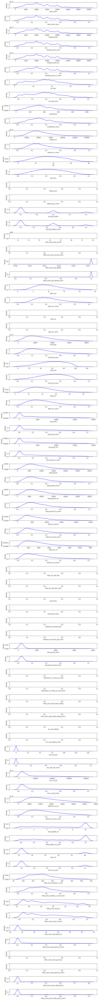

In [111]:
num = ['loan_amnt','loan_amnt_norm','funded_amnt','funded_amnt_norm','funded_amnt_inv','funded_amnt_inv_norm',
        'int_rate','int_rate_norm','installment','installment_norm','annual_inc','annual_inc_norm',
        'dti','dti_norm','delinq_2yrs','delinq_2yrs_norm','inq_last_6mths','inq_last_6mths_norm',
        'mths_since_last_record','mths_since_last_record_norm','mths_since_last_delinq','mths_since_last_delinq_norm',
        'open_acc','open_acc_norm','pub_rec','pub_rec_norm','revol_bal','revol_bal_norm','revol_util','revol_util_norm',
        'total_acc','total_acc_norm','out_prncp','out_prncp_norm','out_prncp_inv','out_prncp_inv_norm',
        'total_pymnt','total_pymnt_norm','total_pymnt_inv','total_pymnt_inv_norm','total_rec_prncp','total_rec_prncp_norm',
        'total_rec_int','total_rec_int_norm','total_rec_late_fee','total_rec_late_fee_norm','recoveries','recoveries_norm',
        'collection_recovery_fee','collection_recovery_fee_norm','last_pymnt_amnt','last_pymnt_amnt_norm',
        'collections_12_mths_ex_med','collections_12_mths_ex_med_norm','mths_since_last_major_derog',
        'mths_since_last_major_derog_norm','acc_now_delinq','acc_now_delinq_norm','tot_coll_amt','tot_coll_amt_norm',
        'tot_cur_bal','tot_cur_bal_norm','total_rev_hi_lim','total_rev_hi_lim_norm','emp_length_int',
        'emp_length_int_norm','term_int','term_int_norm','mths_since_earliest_cr_line',
        'mths_since_earliest_cr_line_norm','mths_since_issue_d','mths_since_issue_d_norm','mths_since_last_pymnt_d',
        'mths_since_last_pymnt_d_norm','mths_since_next_pymnt_d','mths_since_next_pymnt_d_norm',
        'mths_since_last_credit_pull_d','mths_since_last_credit_pull_d_norm']


fig = plt.figure(figsize=(10, 100))
for i in range(0, len(num)):
    plt.subplot(78,1, i+1)
    sns.kdeplot(x = df_iqr[num[i]], color='blue')
    plt.xlabel(num[i])

plt.tight_layout()

### Feature Encoding (Categorical)

In [112]:
df_iqr.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 74152 entries, 42535 to 466280
Data columns (total 87 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   loan_amnt                           74152 non-null  int64  
 1   funded_amnt                         74152 non-null  int64  
 2   funded_amnt_inv                     74152 non-null  float64
 3   int_rate                            74152 non-null  float64
 4   installment                         74152 non-null  float64
 5   grade                               74152 non-null  object 
 6   sub_grade                           74152 non-null  object 
 7   home_ownership                      74152 non-null  object 
 8   annual_inc                          74152 non-null  float64
 9   verification_status                 74152 non-null  object 
 10  purpose                             74152 non-null  object 
 11  addr_state                          

### Encoding

In [113]:
#df_iqr_encod = df_iqr.copy()

In [114]:
# Label Encoding


#df_iqr['emp_length'] = df_iqr['emp_length'].astype('category').cat.codes
#df_iqr['term'] = df_iqr['term'].astype('category').cat.codes
#df_iqr['sub_grade'] = df_iqr['sub_grade'].astype('category').cat.codes
#df_iqr['emp_title'] = df_iqr['emp_title'].astype('category').cat.codes
#df_iqr['issue_d'] = df_iqr['issue_d'].astype('category').cat.codes
#df_iqr['desc'] = df_iqr['desc'].astype('category').cat.codes
#df_iqr['title'] = df_iqr['title'].astype('category').cat.codes
#df_iqr['zip_code'] = df_iqr['zip_code'].astype('category').cat.codes
#df_iqr['earliest_cr_line'] = df_iqr['earliest_cr_line'].astype('category').cat.codes
#df_iqr['last_pymnt_d'] = df_iqr['last_pymnt_d'].astype('category').cat.codes
#df_iqr['next_pymnt_d'] = df_iqr['next_pymnt_d'].astype('category').cat.codes
#df_iqr['last_credit_pull_d'] = df_iqr['last_credit_pull_d'].astype('category').cat.codes
#df_iqr['application_type'] = df_iqr['application_type'].astype('category').cat.codes
#df_iqr['plan_payment'] = df_iqr['plan_payment'].astype('category').cat.codes

In [115]:
#One Hot Encoding
for cat in ['grade','sub_grade','home_ownership','verification_status','purpose',
            'addr_state','initial_list','plan_payment']:
  onehots = pd.get_dummies(df_iqr[cat], prefix=cat)
  df_iqr = df_iqr.join(onehots)

In [116]:
df_onehots = df_iqr.drop(columns=['grade','sub_grade','home_ownership','verification_status',
                                   'purpose','addr_state','initial_list','plan_payment',
                                  'loan_amnt','funded_amnt','funded_amnt_inv','int_rate',
                                  'installment','annual_inc',"dti","delinq_2yrs","inq_last_6mths",
                                  "mths_since_last_delinq","mths_since_last_record","open_acc","pub_rec",
                                  "revol_bal","revol_util","total_acc","out_prncp","out_prncp_inv",
                                  "total_pymnt","total_pymnt_inv","total_rec_prncp","total_rec_int",
                                  "total_rec_late_fee","recoveries","collection_recovery_fee","last_pymnt_amnt",
                                  "collections_12_mths_ex_med","mths_since_last_major_derog","acc_now_delinq",
                                  "tot_coll_amt","tot_cur_bal","total_rev_hi_lim",'emp_length_int','term_int',
                                  'mths_since_earliest_cr_line','mths_since_issue_d','mths_since_last_pymnt_d',
                                  'mths_since_next_pymnt_d','mths_since_last_credit_pull_d']).copy()

In [117]:
df_onehots.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 74152 entries, 42535 to 466280
Columns: 150 entries, label to plan_payment_Not an installment plan
dtypes: float64(39), int64(1), uint8(110)
memory usage: 33.0 MB


In [118]:
df_onehots.head()

,label,loan_amnt_norm,funded_amnt_norm,funded_amnt_inv_norm,int_rate_norm,installment_norm,annual_inc_norm,dti_norm,delinq_2yrs_norm,inq_last_6mths_norm,...,addr_state_UT,addr_state_VA,addr_state_VT,addr_state_WA,addr_state_WI,addr_state_WV,addr_state_WY,initial_list_fully funded,initial_list_not yet fully funded,plan_payment_Not an installment plan
42535,0,0.766176,0.766176,0.766520,0.266845,0.856300,0.329215,0.573039,0.0,0.0,...,0,0,0,0,0,0,0,0,1,1
42536,0,0.257353,0.257353,0.258443,0.426738,0.307760,0.134373,0.629416,0.0,0.0,...,0,0,0,0,0,0,0,1,0,1
42540,0,0.323529,0.323529,0.324523,0.320321,0.372692,0.833115,0.326485,0.0,0.5,...,0,0,0,0,0,0,0,1,0,1
42542,0,0.192647,0.192647,0.193833,0.547594,0.241417,0.147811,0.210474,0.0,0.0,...,0,0,0,0,0,0,0,0,1,1
42545,0,0.323529,0.323529,0.324523,0.086631,0.348280,0.608040,0.315961,0.0,0.0,...,0,0,0,0,0,0,0,1,0,1


In [119]:
#df_iqr_onehot = df_iqr.copy()

In [120]:
#categorical_cols = [col for col in df_iqr_onehot.select_dtypes(include='object').columns.tolist()]

In [121]:
#onehot = pd.get_dummies(df_iqr_onehot[categorical_cols], drop_first=True)
#onehot.head()

### Handling Class Imbalance - Oversampling

In [122]:
df_over = df_onehots.copy()

In [123]:
x_ov = df_over.drop(["label"], axis=1)
y_ov = df_over["label"]

In [124]:
y_ov.value_counts()

0    67465
1     6687
Name: label, dtype: int64

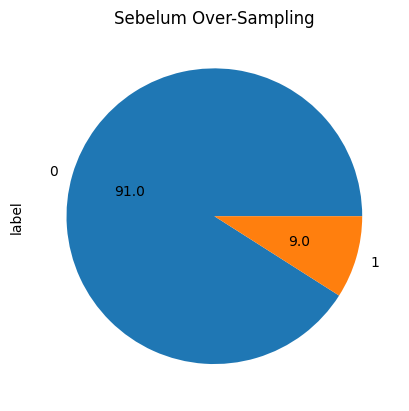

In [125]:
ax = y_ov.value_counts().plot.pie(autopct='%.1f')
_ = ax.set_title("Sebelum Over-Sampling")

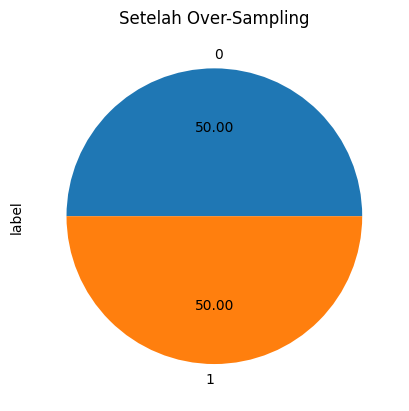

In [126]:
from imblearn.over_sampling import RandomOverSampler
ros = RandomOverSampler(sampling_strategy="not majority")
x_over, y_over = ros.fit_resample(x_ov, y_ov)

ax = y_over.value_counts().plot.pie(autopct='%.2f')
_ = ax.set_title("Setelah Over-Sampling")

In [127]:
y_over.value_counts()

0    67465
1    67465
Name: label, dtype: int64

### Handling Class Imbalance - Undersampling

In [128]:
df_under = df_onehots.copy()

In [129]:
x_un = df_under.drop(["label"], axis=1)
y_un = df_under["label"]

In [130]:
y_un.value_counts()

0    67465
1     6687
Name: label, dtype: int64

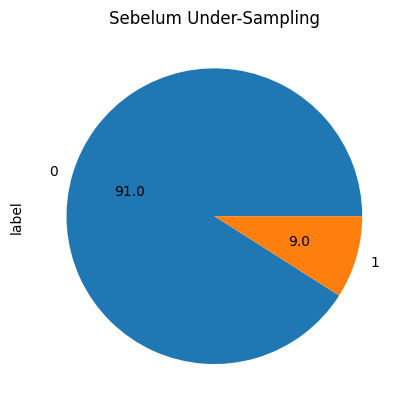

In [131]:
ax = y_un.value_counts().plot.pie(autopct='%.1f')
_ = ax.set_title("Sebelum Under-Sampling")

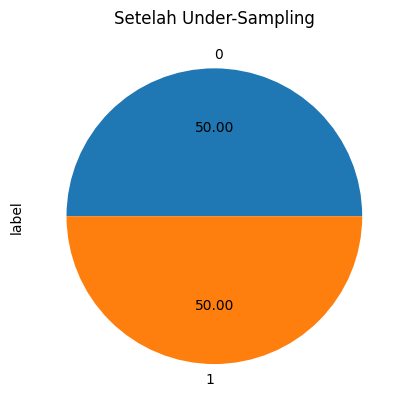

In [132]:
from imblearn.under_sampling import RandomUnderSampler
rus = RandomUnderSampler(sampling_strategy=1)
x_under, y_under = rus.fit_resample(x_un, y_un)

ax = y_under.value_counts().plot.pie(autopct='%.2f')
_ = ax.set_title("Setelah Under-Sampling")

In [133]:
y_under.value_counts()

0    6687
1    6687
Name: label, dtype: int64

# **Machine Learning Evaluation and Supervised Learning**

In [134]:
#import pandas as pd
#from sklearn.model_selection import train_test_split
#from sklearn.linear_model import LogisticRegression
#from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc
#import matplotlib.pyplot as plt

# Load your data (replace this with your data loading process)
# data = ...

# Define your features (X) and target variable (y)
#X = x_over
#y = y_over

# Split the data into training and testing sets
#x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Initialize and train the Logistic Regression model
#lr = LogisticRegression(random_state=42, max_iter=1000)
#lr.fit(x_train, y_train)

# Make predictions
#y_pred = lr.predict(x_test)
#y_pred_proba = lr.predict_proba(x_test)

# Define a function to evaluate classification metrics
#def eval_classification(model, pred, xtrain, ytrain, xtest, ytest):
    #print("Accuracy (Test Set): %.2f" % accuracy_score(ytest, pred))
    #print("Precision (Test Set): %.2f" % precision_score(ytest, pred))
    #print("Recall (Test Set): %.2f" % recall_score(ytest, pred))
    #print("F1-Score (Test Set): %.2f" % f1_score(ytest, pred))
    #print("ROC_AUC (Test Set): %.2f" % roc_auc_score(ytest, y_pred_proba[:, 1]))

# Print evaluation metrics
#eval_classification(lr, y_pred, x_train, y_train, x_test, y_test)

In [135]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import auc

def eval_classification(model, pred, xtrain, ytrain, xtest, ytest):
    print("Accuracy (Test Set): %.2f" % accuracy_score(ytest, pred))
    print("Precision (Test Set): %.2f" % precision_score(ytest, pred))
    print("Recall (Test Set): %.2f" % recall_score(ytest, pred))
    print("F1-Score (Test Set): %.2f" % f1_score(ytest, pred))

    print("ROC_AUC (Test-proba): %.2f" % roc_auc_score(y_test, y_pred_proba[:, 1]))
    print("ROC_AUC (Train-proba): %.2f" % roc_auc_score(y_train, y_pred_proba_train[:, 1]))

    #fpr, tpr, thresholds = roc_curve(ytest, pred, pos_label=1) # pos_label: label yang kita anggap positive
    #print("AUC: %.2f" % auc(fpr, tpr))

def show_feature_importance(model):
    feat_importances = pd.Series(model.feature_importances_, index=x_over.columns)
    ax = feat_importances.nlargest(25).plot(kind='barh', figsize=(10, 8))
    ax.invert_yaxis()

    plt.xlabel('score')
    plt.ylabel('feature')
    plt.title('feature importance score')

def show_best_hyperparameter(model, hyperparameters):
    for key, value in hyperparameters.items() :
        print('Best '+key+':', model.get_params()[key])

# **Scenario 1 (Oversampling)**

In [136]:
from sklearn.model_selection import train_test_split

x_1 = x_over
y_1 = y_over
x_train, x_test, y_train, y_test = train_test_split(x_1, y_1, test_size=0.3, random_state=42)

## Logistic Regression

In [137]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression(random_state=42, max_iter = 1000)
lr.fit(x_train, y_train)

y_pred = lr.predict(x_test)
y_pred_proba = lr.predict_proba(x_test)
y_pred_proba_train = lr.predict_proba(x_train)
eval_classification(lr, y_pred, x_train, y_train, x_test, y_test)

Accuracy (Test Set): 0.89
Precision (Test Set): 0.96
Recall (Test Set): 0.82
F1-Score (Test Set): 0.89
ROC_AUC (Test-proba): 0.96
ROC_AUC (Train-proba): 0.96


In [138]:
# cross validation
from sklearn.model_selection import cross_val_score
model = LogisticRegression(random_state=42, max_iter = 1000)

result = cross_val_score(model, x_1, y_1, cv=5, scoring='roc_auc') # calculate score
result.mean()

0.9434299469514755

In [139]:
# confusion matrix
from sklearn.metrics import confusion_matrix
lr = LogisticRegression(random_state=42, max_iter = 1000)
lr.fit(x_train, y_train)

y_pred = lr.predict(x_test)
cm = confusion_matrix(y_test,y_pred)
cm

array([[19518,   707],
       [ 3568, 16686]])

## k-Nearest Neighbor

In [140]:
from sklearn.neighbors import KNeighborsClassifier # import knn dari sklearn
knn = KNeighborsClassifier() # inisiasi object dengan nama knn
knn.fit(x_train, y_train) # fit model KNN dari data train

y_pred = knn.predict(x_test)
y_pred_proba = knn.predict_proba(x_test)
y_pred_proba_train = knn.predict_proba(x_train)
eval_classification(knn, y_pred, x_train, y_train, x_test, y_test)

Accuracy (Test Set): 0.87
Precision (Test Set): 0.80
Recall (Test Set): 0.99
F1-Score (Test Set): 0.89
ROC_AUC (Test-proba): 0.95
ROC_AUC (Train-proba): 1.00


In [141]:
# cross validation
from sklearn.model_selection import cross_val_score
model = KNeighborsClassifier()

result = cross_val_score(model, x_1, y_1, cv=5, scoring='roc_auc') # calculate score
result.mean()

0.9477639761374768

In [142]:
# confusion matrix
from sklearn.metrics import confusion_matrix
knn = KNeighborsClassifier() # inisiasi object dengan nama knn
knn.fit(x_train, y_train)

y_pred = knn.predict(x_test)
cm = confusion_matrix(y_test,y_pred)
cm

array([[15329,  4896],
       [  278, 19976]])

## Decision Tree

In [143]:
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier(random_state=42)
dt.fit(x_train, y_train)

y_pred = dt.predict(x_test)
y_pred_proba = dt.predict_proba(x_test)
y_pred_proba_train = dt.predict_proba(x_train)
eval_classification(dt, y_pred, x_train, y_train, x_test, y_test)

Accuracy (Test Set): 0.99
Precision (Test Set): 0.97
Recall (Test Set): 1.00
F1-Score (Test Set): 0.99
ROC_AUC (Test-proba): 0.99
ROC_AUC (Train-proba): 1.00


In [144]:
# cross validation
from sklearn.model_selection import cross_val_score
model = DecisionTreeClassifier(random_state=42)

result = cross_val_score(model, x_1, y_1, cv=5, scoring='roc_auc') # calculate score
result.mean()

0.7560512858519232

In [145]:
# confusion matrix
from sklearn.metrics import confusion_matrix
dt = DecisionTreeClassifier(random_state=42)
dt.fit(x_train, y_train)

y_pred = dt.predict(x_test)
cm = confusion_matrix(y_test,y_pred)
cm

array([[19700,   525],
       [    0, 20254]])

## Bagging: Random Forest

In [146]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(random_state=42)
rfc.fit(x_train, y_train)

y_pred = rfc.predict(x_test)
y_pred_proba = rfc.predict_proba(x_test)
y_pred_proba_train = rfc.predict_proba(x_train)
eval_classification(rfc, y_pred, x_train, y_train, x_test, y_test)

Accuracy (Test Set): 1.00
Precision (Test Set): 1.00
Recall (Test Set): 1.00
F1-Score (Test Set): 1.00
ROC_AUC (Test-proba): 1.00
ROC_AUC (Train-proba): 1.00


In [147]:
# cross validation
from sklearn.model_selection import cross_val_score
model = RandomForestClassifier(random_state=42)

result = cross_val_score(model, x_1, y_1, cv=5, scoring='roc_auc') # calculate score
result.mean()

0.9999994359035028

In [148]:
# confusion matrix
from sklearn.metrics import confusion_matrix
rf = RandomForestClassifier(random_state=42)
rf.fit(x_train, y_train)

y_pred = rf.predict(x_test)
cm = confusion_matrix(y_test,y_pred)
cm

array([[20225,     0],
       [    0, 20254]])

## Boosting: AdaBoost

In [149]:
from sklearn.ensemble import AdaBoostClassifier
ab = AdaBoostClassifier(random_state=42)
ab.fit(x_train, y_train)

y_pred = ab.predict(x_test)
y_pred_proba = ab.predict_proba(x_test)
y_pred_proba_train = ab.predict_proba(x_train)
eval_classification(ab, y_pred, x_train, y_train, x_test, y_test)

Accuracy (Test Set): 0.92
Precision (Test Set): 0.92
Recall (Test Set): 0.92
F1-Score (Test Set): 0.92
ROC_AUC (Test-proba): 0.98
ROC_AUC (Train-proba): 0.98


In [150]:
# cross validation
from sklearn.model_selection import cross_val_score
model = AdaBoostClassifier(random_state=42)

result = cross_val_score(model, x_1, y_1, cv=5, scoring='roc_auc') # calculate score
result.mean()

0.8304763283001847

In [151]:
# confusion matrix
from sklearn.metrics import confusion_matrix
ab = AdaBoostClassifier(random_state=42)
ab.fit(x_train, y_train)

y_pred = ab.predict(x_test)
cm = confusion_matrix(y_test,y_pred)
cm

array([[18637,  1588],
       [ 1635, 18619]])

## Boosting: XgBoost

In [152]:
from xgboost import XGBClassifier
xg = XGBClassifier(random_state=42, eval_metric = 'logloss', use_label_encoder = False)
xg.fit(x_train, y_train)

y_pred = xg.predict(x_test)
y_pred_proba = xg.predict_proba(x_test)
y_pred_proba_train = xg.predict_proba(x_train)
eval_classification(xg, y_pred, x_train, y_train, x_test, y_test)

/usr/local/lib/python3.10/dist-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")


Accuracy (Test Set): 0.99
Precision (Test Set): 0.99
Recall (Test Set): 0.99
F1-Score (Test Set): 0.99
ROC_AUC (Test-proba): 1.00
ROC_AUC (Train-proba): 1.00


In [153]:
# cross validation
from sklearn.model_selection import cross_val_score
model = XGBClassifier(random_state=42, eval_metric = 'logloss', use_label_encoder = False)

result = cross_val_score(model, x_1, y_1, cv=5, scoring='roc_auc') # calculate score
result.mean()

/usr/local/lib/python3.10/dist-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/usr/local/lib/python3.10/dist-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/usr/local/lib/python3.10/dist-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/usr/local/lib/python3.10/dist-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/usr/local/lib/python3.10/dist-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/usr/local/lib/python3.10/dist-packages/xgboost/sklearn.py:1395: UserWarnin

0.9288699682269763

In [154]:
# confusion matrix
from sklearn.metrics import confusion_matrix
ab = AdaBoostClassifier(random_state=42)
ab.fit(x_train, y_train)

y_pred = xg.predict(x_test)
cm = confusion_matrix(y_test,y_pred)
cm

array([[19992,   233],
       [  174, 20080]])

## Catboost

In [155]:
pip install catboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.6/98.6 MB 2.9 MB/s eta 0:00:00


In [156]:
from catboost import CatBoostClassifier
cb = CatBoostClassifier(random_state=42)
cb.fit(x_train, y_train)

y_pred = cb.predict(x_test)
y_pred_proba = cb.predict_proba(x_test)
y_pred_proba_train = cb.predict_proba(x_train)
eval_classification(cb, y_pred, x_train, y_train, x_test, y_test)

Learning rate set to 0.071837
0:	learn: 0.6026395	total: 90.8ms	remaining: 1m 30s
1:	learn: 0.5232819	total: 130ms	remaining: 1m 5s
2:	learn: 0.4622184	total: 184ms	remaining: 1m 1s
3:	learn: 0.4148455	total: 221ms	remaining: 55.1s
4:	learn: 0.3686911	total: 261ms	remaining: 52s
5:	learn: 0.3388238	total: 309ms	remaining: 51.1s
6:	learn: 0.3141682	total: 348ms	remaining: 49.4s
7:	learn: 0.2935725	total: 386ms	remaining: 47.8s
8:	learn: 0.2790911	total: 426ms	remaining: 47s
9:	learn: 0.2549786	total: 476ms	remaining: 47.1s
10:	learn: 0.2462898	total: 511ms	remaining: 45.9s
11:	learn: 0.2357049	total: 550ms	remaining: 45.3s
12:	learn: 0.2245716	total: 597ms	remaining: 45.4s
13:	learn: 0.2195343	total: 634ms	remaining: 44.6s
14:	learn: 0.2112342	total: 672ms	remaining: 44.1s
15:	learn: 0.2051609	total: 759ms	remaining: 46.7s
16:	learn: 0.2006400	total: 849ms	remaining: 49.1s
17:	learn: 0.1978628	total: 985ms	remaining: 53.7s
18:	learn: 0.1948979	total: 1.09s	remaining: 56.4s
19:	learn: 0.

In [157]:
# cross validation
from sklearn.model_selection import cross_val_score
model = CatBoostClassifier(random_state=42)

result = cross_val_score(model, x_1, y_1, cv=5, scoring='roc_auc') # calculate score
result.mean()

Output streaming akan dipotong hingga 5000 baris terakhir.
4:	learn: 0.3509405	total: 222ms	remaining: 44.2s
5:	learn: 0.3145856	total: 279ms	remaining: 46.3s
6:	learn: 0.2859539	total: 321ms	remaining: 45.5s
7:	learn: 0.2683562	total: 360ms	remaining: 44.6s
8:	learn: 0.2508163	total: 431ms	remaining: 47.5s
9:	learn: 0.2393244	total: 537ms	remaining: 53.2s
10:	learn: 0.2214741	total: 660ms	remaining: 59.3s
11:	learn: 0.2088662	total: 736ms	remaining: 1m
12:	learn: 0.2027863	total: 795ms	remaining: 1m
13:	learn: 0.1950020	total: 857ms	remaining: 1m
14:	learn: 0.1911218	total: 946ms	remaining: 1m 2s
15:	learn: 0.1860304	total: 1.01s	remaining: 1m 2s
16:	learn: 0.1830457	total: 1.05s	remaining: 1m
17:	learn: 0.1792283	total: 1.11s	remaining: 1m
18:	learn: 0.1753330	total: 1.15s	remaining: 59.5s
19:	learn: 0.1712565	total: 1.19s	remaining: 58.4s
20:	learn: 0.1695905	total: 1.23s	remaining: 57.4s
21:	learn: 0.1663339	total: 1.27s	remaining: 56.5s
22:	learn: 0.1641678	total: 1.32s	remaining:

0.9403536678512712

In [158]:
# confusion matrix
from sklearn.metrics import confusion_matrix
cb = CatBoostClassifier(random_state=42)
cb.fit(x_train, y_train)

y_pred = cb.predict(x_test)
cm = confusion_matrix(y_test,y_pred)
cm

Learning rate set to 0.071837
0:	learn: 0.6026395	total: 74ms	remaining: 1m 13s
1:	learn: 0.5232819	total: 163ms	remaining: 1m 21s
2:	learn: 0.4622184	total: 245ms	remaining: 1m 21s
3:	learn: 0.4148455	total: 324ms	remaining: 1m 20s
4:	learn: 0.3686911	total: 405ms	remaining: 1m 20s
5:	learn: 0.3388238	total: 488ms	remaining: 1m 20s
6:	learn: 0.3141682	total: 566ms	remaining: 1m 20s
7:	learn: 0.2935725	total: 622ms	remaining: 1m 17s
8:	learn: 0.2790911	total: 675ms	remaining: 1m 14s
9:	learn: 0.2549786	total: 751ms	remaining: 1m 14s
10:	learn: 0.2462898	total: 843ms	remaining: 1m 15s
11:	learn: 0.2357049	total: 931ms	remaining: 1m 16s
12:	learn: 0.2245716	total: 1.02s	remaining: 1m 17s
13:	learn: 0.2195343	total: 1.11s	remaining: 1m 18s
14:	learn: 0.2112342	total: 1.2s	remaining: 1m 19s
15:	learn: 0.2051609	total: 1.29s	remaining: 1m 19s
16:	learn: 0.2006400	total: 1.38s	remaining: 1m 19s
17:	learn: 0.1978628	total: 1.46s	remaining: 1m 19s
18:	learn: 0.1948979	total: 1.52s	remaining: 1

array([[20010,   215],
       [  182, 20072]])

# **Scenario 2 (Undersampling)**

In [159]:
from sklearn.model_selection import train_test_split

x_2 = x_under
y_2 = y_under
X_train, X_test, y_train, y_test = train_test_split(x_2, y_2, test_size=0.3, random_state=42)

## Logistic Regression

In [160]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression(random_state=42, max_iter = 1000)
lr.fit(X_train, y_train)

y_pred = lr.predict(X_test)
y_pred_proba = lr.predict_proba(X_test)
y_pred_proba_train = lr.predict_proba(X_train)
eval_classification(lr, y_pred, X_train, y_train, X_test, y_test)

Accuracy (Test Set): 0.88
Precision (Test Set): 0.96
Recall (Test Set): 0.80
F1-Score (Test Set): 0.87
ROC_AUC (Test-proba): 0.95
ROC_AUC (Train-proba): 0.95


In [161]:
# cross validation
from sklearn.model_selection import cross_val_score
model = LogisticRegression(random_state=42, max_iter = 1000)

result = cross_val_score(model, x_2, y_2, cv=5, scoring='roc_auc') # calculate score
result.mean()

0.9326212496016367

In [162]:
# confusion matrix
from sklearn.metrics import confusion_matrix
lr = LogisticRegression(random_state=42, max_iter = 1000)
lr.fit(X_train, y_train)

y_pred = lr.predict(X_test)
cm = confusion_matrix(y_test,y_pred)
cm

array([[1982,   72],
       [ 394, 1565]])

## k-Nearest Neighbor

In [163]:
from sklearn.neighbors import KNeighborsClassifier # import knn dari sklearn
knn = KNeighborsClassifier() # inisiasi object dengan nama knn
knn.fit(X_train, y_train) # fit model KNN dari data train

y_pred = knn.predict(X_test)
y_pred_proba = knn.predict_proba(X_test)
y_pred_proba_train = knn.predict_proba(X_train)
eval_classification(knn, y_pred, X_train, y_train, X_test, y_test)

Accuracy (Test Set): 0.67
Precision (Test Set): 0.65
Recall (Test Set): 0.69
F1-Score (Test Set): 0.67
ROC_AUC (Test-proba): 0.72
ROC_AUC (Train-proba): 0.87


In [164]:
# cross validation
from sklearn.model_selection import cross_val_score
model =  KNeighborsClassifier()

result = cross_val_score(model, x_2, y_2, cv=5, scoring='roc_auc') # calculate score
result.mean()

0.6984171627544294

In [165]:
# confusion matrix
from sklearn.metrics import confusion_matrix
knn = KNeighborsClassifier() # inisiasi object dengan nama knn
knn.fit(X_train, y_train)

y_pred = knn.predict(X_test)
cm = confusion_matrix(y_test,y_pred)
cm

array([[1329,  725],
       [ 610, 1349]])

## Decision Tree

In [166]:
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier(random_state=42)
dt.fit(X_train, y_train)

y_pred = dt.predict(X_test)
y_pred_proba = dt.predict_proba(X_test)
y_pred_proba_train = dt.predict_proba(X_train)
eval_classification(dt, y_pred, X_train, y_train, X_test, y_test)

Accuracy (Test Set): 0.90
Precision (Test Set): 0.90
Recall (Test Set): 0.90
F1-Score (Test Set): 0.90
ROC_AUC (Test-proba): 0.90
ROC_AUC (Train-proba): 1.00


In [167]:
# cross validation
from sklearn.model_selection import cross_val_score
model =  DecisionTreeClassifier(random_state=42)

result = cross_val_score(model, x_2, y_2, cv=5, scoring='roc_auc') # calculate score
result.mean()

0.8052896015777241

In [168]:
# confusion matrix
from sklearn.metrics import confusion_matrix
dt = DecisionTreeClassifier(random_state=42)
dt.fit(X_train, y_train)

y_pred = dt.predict(X_test)
cm = confusion_matrix(y_test,y_pred)
cm

array([[1850,  204],
       [ 188, 1771]])

## Bagging: Random Forest

In [169]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(random_state=42)
rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)
y_pred_proba = rf.predict_proba(X_test)
y_pred_proba_train = rf.predict_proba(X_train)
eval_classification(rf, y_pred, X_train, y_train, X_test, y_test)

Accuracy (Test Set): 0.93
Precision (Test Set): 0.99
Recall (Test Set): 0.88
F1-Score (Test Set): 0.93
ROC_AUC (Test-proba): 0.98
ROC_AUC (Train-proba): 1.00


In [170]:
# cross validation
from sklearn.model_selection import cross_val_score
model = RandomForestClassifier(random_state=42)

result = cross_val_score(model, x_2, y_2, cv=5, scoring='roc_auc') # calculate score
result.mean()

0.94381145893087

In [171]:
# confusion matrix
from sklearn.metrics import confusion_matrix
rf = RandomForestClassifier(random_state=42)
rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)
cm = confusion_matrix(y_test,y_pred)
cm

array([[2032,   22],
       [ 243, 1716]])

## Boosting: AdaBoost

In [172]:
from sklearn.ensemble import AdaBoostClassifier
ab = AdaBoostClassifier(random_state=42)
ab.fit(X_train, y_train)

y_pred = ab.predict(X_test)
y_pred_proba = ab.predict_proba(X_test)
y_pred_proba_train = ab.predict_proba(X_train)
eval_classification(ab, y_pred, X_train, y_train, X_test, y_test)

Accuracy (Test Set): 0.92
Precision (Test Set): 0.92
Recall (Test Set): 0.91
F1-Score (Test Set): 0.92
ROC_AUC (Test-proba): 0.98
ROC_AUC (Train-proba): 0.98


In [173]:
# cross validation
from sklearn.model_selection import cross_val_score
model = AdaBoostClassifier(random_state=42)

result = cross_val_score(model, x_2, y_2, cv=5, scoring='roc_auc') # calculate score
result.mean()

0.858186437250772

In [174]:
# confusion matrix
from sklearn.metrics import confusion_matrix
ab = AdaBoostClassifier(random_state=42)
ab.fit(X_train, y_train)

y_pred = ab.predict(X_test)
cm = confusion_matrix(y_test,y_pred)
cm

array([[1897,  157],
       [ 174, 1785]])

## Boosting: XgBoost

In [175]:
from xgboost import XGBClassifier
xg = XGBClassifier(random_state=42, eval_metric = 'logloss', use_label_encoder = False)
xg.fit(X_train, y_train)

y_pred = xg.predict(X_test)
y_pred_proba = xg.predict_proba(X_test)
y_pred_proba_train = xg.predict_proba(X_train)
eval_classification(xg, y_pred, X_train, y_train, X_test, y_test)

/usr/local/lib/python3.10/dist-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")


Accuracy (Test Set): 0.93
Precision (Test Set): 0.95
Recall (Test Set): 0.91
F1-Score (Test Set): 0.93
ROC_AUC (Test-proba): 0.98
ROC_AUC (Train-proba): 1.00


In [176]:
# cross validation
from sklearn.model_selection import cross_val_score
model = XGBClassifier(random_state=42, eval_metric = 'logloss', use_label_encoder = False)

result = cross_val_score(model, x_2, y_2, cv=5, scoring='roc_auc') # calculate score
result.mean()

/usr/local/lib/python3.10/dist-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/usr/local/lib/python3.10/dist-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/usr/local/lib/python3.10/dist-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/usr/local/lib/python3.10/dist-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/usr/local/lib/python3.10/dist-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/usr/local/lib/python3.10/dist-packages/xgboost/sklearn.py:1395: UserWarnin

0.9292950447794436

In [177]:
# confusion matrix
from sklearn.metrics import confusion_matrix
xg = XGBClassifier(random_state=42, eval_metric = 'logloss', use_label_encoder = False)
xg.fit(X_train, y_train)

y_pred = xg.predict(X_test)
cm = confusion_matrix(y_test,y_pred)
cm

/usr/local/lib/python3.10/dist-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")


array([[1961,   93],
       [ 173, 1786]])

## Catboost

In [178]:
from catboost import CatBoostClassifier
cb = CatBoostClassifier(random_state=42)
cb.fit(X_train, y_train)

y_pred = cb.predict(X_test)
y_pred_proba = cb.predict_proba(X_test)
y_pred_proba_train = cb.predict_proba(X_train)
eval_classification(cb, y_pred, X_train, y_train, X_test, y_test)

Learning rate set to 0.026772
0:	learn: 0.6610134	total: 9.56ms	remaining: 9.55s
1:	learn: 0.6303661	total: 18.8ms	remaining: 9.38s
2:	learn: 0.6005247	total: 28.1ms	remaining: 9.36s
3:	learn: 0.5765515	total: 37.2ms	remaining: 9.27s
4:	learn: 0.5502198	total: 46.4ms	remaining: 9.22s
5:	learn: 0.5238361	total: 55.6ms	remaining: 9.21s
6:	learn: 0.5023856	total: 64.7ms	remaining: 9.17s
7:	learn: 0.4836746	total: 74ms	remaining: 9.18s
8:	learn: 0.4637802	total: 83.8ms	remaining: 9.22s
9:	learn: 0.4478842	total: 93.6ms	remaining: 9.26s
10:	learn: 0.4321350	total: 103ms	remaining: 9.25s
11:	learn: 0.4175031	total: 113ms	remaining: 9.3s
12:	learn: 0.4003054	total: 122ms	remaining: 9.27s
13:	learn: 0.3855894	total: 131ms	remaining: 9.25s
14:	learn: 0.3746560	total: 140ms	remaining: 9.2s
15:	learn: 0.3623906	total: 149ms	remaining: 9.19s
16:	learn: 0.3528531	total: 159ms	remaining: 9.21s
17:	learn: 0.3445046	total: 169ms	remaining: 9.19s
18:	learn: 0.3328212	total: 178ms	remaining: 9.19s
19:	l

In [179]:
# cross validation
from sklearn.model_selection import cross_val_score
model = CatBoostClassifier(random_state=42)

result = cross_val_score(model, x_2, y_2, cv=5, scoring='roc_auc') # calculate score
result.mean()

Output streaming akan dipotong hingga 5000 baris terakhir.
4:	learn: 0.5356970	total: 60.8ms	remaining: 12.1s
5:	learn: 0.5115434	total: 71.5ms	remaining: 11.8s
6:	learn: 0.4890250	total: 83.4ms	remaining: 11.8s
7:	learn: 0.4668828	total: 96.4ms	remaining: 12s
8:	learn: 0.4451624	total: 107ms	remaining: 11.8s
9:	learn: 0.4304048	total: 118ms	remaining: 11.7s
10:	learn: 0.4111069	total: 128ms	remaining: 11.5s
11:	learn: 0.3970182	total: 138ms	remaining: 11.4s
12:	learn: 0.3855071	total: 148ms	remaining: 11.3s
13:	learn: 0.3723251	total: 159ms	remaining: 11.2s
14:	learn: 0.3594535	total: 169ms	remaining: 11.1s
15:	learn: 0.3492318	total: 180ms	remaining: 11.1s
16:	learn: 0.3384825	total: 194ms	remaining: 11.2s
17:	learn: 0.3261041	total: 205ms	remaining: 11.2s
18:	learn: 0.3165208	total: 216ms	remaining: 11.2s
19:	learn: 0.3073376	total: 226ms	remaining: 11.1s
20:	learn: 0.2985937	total: 237ms	remaining: 11s
21:	learn: 0.2921859	total: 247ms	remaining: 11s
22:	learn: 0.2871394	total: 258

0.9366805047435127

In [180]:
# confusion matrix
from sklearn.metrics import confusion_matrix
cb = CatBoostClassifier(random_state=42)
cb.fit(X_train, y_train)

y_pred = cb.predict(X_test)
cm = confusion_matrix(y_test,y_pred)
cm

Learning rate set to 0.026772
0:	learn: 0.6610134	total: 19.7ms	remaining: 19.7s
1:	learn: 0.6303661	total: 35.1ms	remaining: 17.5s
2:	learn: 0.6005247	total: 45.8ms	remaining: 15.2s
3:	learn: 0.5765515	total: 54.6ms	remaining: 13.6s
4:	learn: 0.5502198	total: 63.5ms	remaining: 12.6s
5:	learn: 0.5238361	total: 72.6ms	remaining: 12s
6:	learn: 0.5023856	total: 81.8ms	remaining: 11.6s
7:	learn: 0.4836746	total: 90.8ms	remaining: 11.3s
8:	learn: 0.4637802	total: 101ms	remaining: 11.1s
9:	learn: 0.4478842	total: 111ms	remaining: 11s
10:	learn: 0.4321350	total: 121ms	remaining: 10.8s
11:	learn: 0.4175031	total: 130ms	remaining: 10.7s
12:	learn: 0.4003054	total: 140ms	remaining: 10.6s
13:	learn: 0.3855894	total: 149ms	remaining: 10.5s
14:	learn: 0.3746560	total: 163ms	remaining: 10.7s
15:	learn: 0.3623906	total: 183ms	remaining: 11.3s
16:	learn: 0.3528531	total: 199ms	remaining: 11.5s
17:	learn: 0.3445046	total: 215ms	remaining: 11.7s
18:	learn: 0.3328212	total: 227ms	remaining: 11.7s
19:	lea

array([[1979,   75],
       [ 189, 1770]])

Validation matrix yang digunakan adalah **ROC_AUC**, diperoleh nilai **ROC_AUC** tertinggi pada model Catboost sebesar 1.00 dan pada tahap ini tidak dilakukan **Hyperparametr Tuning** karena model telah menghasilkan **ROC_AUC = 1.00**


In [ ]:
# Hyperparameter Tuning


#from sklearn.metrics import accuracy_score
#from sklearn.metrics import precision_score
#from sklearn.metrics import recall_score
#from sklearn.metrics import f1_score
#from sklearn.metrics import roc_curve
#from sklearn.metrics import roc_auc_score
#from sklearn.metrics import auc

#def eval_classification(model, pred, xtrain, ytrain, xtest, ytest):
    #print("Accuracy (Test Set): %.2f" % accuracy_score(ytest, pred))
    #print("Precision (Test Set): %.2f" % precision_score(ytest, pred))
    #print("Recall (Test Set): %.2f" % recall_score(ytest, pred))
    #print("F1-Score (Test Set): %.2f" % f1_score(ytest, pred))

    #print("ROC_AUC (Test-proba): %.2f" % roc_auc_score(y_test, y_pred_proba[:, 1]))
    #print("ROC_AUC (Train-proba): %.2f" % roc_auc_score(y_train, y_pred_proba_train[:, 1]))

    #fpr, tpr, thresholds = roc_curve(ytest, pred, pos_label=1) # pos_label: label yang kita anggap positive
    #print("AUC: %.2f" % auc(fpr, tpr))

#def show_feature_importance(model):
    #feat_importances = pd.Series(model.feature_importances_, index=x_over.columns)
    #ax = feat_importances.nlargest(25).plot(kind='barh', figsize=(10, 8))
    #ax.invert_yaxis()

    #plt.xlabel('score')
    #plt.ylabel('feature')
    #plt.title('feature importance score')

#def show_best_hyperparameter(model, hyperparameters):
    #for key, value in hyperparameters.items() :
        #print('Best '+key+':', model.get_params()[key])

In [ ]:
#from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
#from catboost import CatBoostClassifier


#hyperparameters = dict(
                      #iterations = [int(x) for x in np.linspace(start = 100, stop = 2000, num = 20)],
                      #depth = [int(x) for x in np.linspace(start = 1, stop = 20, num = 10)],
                      #learning_rate = [0.03,0.001,0.01,0.1,0.2,0.3],
                      #l2_leaf_reg = [3,1,5,10,100]
                      #)

# Init
#cb = CatBoostClassifier(random_state=42)
#cb_tuned = GridSearchCV(cb, hyperparameters, cv=5, scoring='roc_auc')
#cb_tuned.fit(X_train,Y_train)

# Predict & Evaluation
#y_pred = cb_tuned.predict(X_test)#Check performa dari model
#eval_classification(cb_tuned, y_pred, X_train, Y_train, X_test, Y_test)

# Feature Importance

In [194]:
from sklearn.model_selection import train_test_split

x_3 = x_over
y_3 = y_over
X_train, X_test, Y_train, Y_test = train_test_split(x_3, y_3, test_size=0.3, random_state=42)

In [195]:
from catboost import CatBoostClassifier
cb = CatBoostClassifier(random_state=42)
cb.fit(X_train, Y_train)

Learning rate set to 0.071837
0:	learn: 0.6026395	total: 34.5ms	remaining: 34.5s
1:	learn: 0.5232819	total: 66.9ms	remaining: 33.4s
2:	learn: 0.4622184	total: 100ms	remaining: 33.3s
3:	learn: 0.4148455	total: 135ms	remaining: 33.5s
4:	learn: 0.3686911	total: 173ms	remaining: 34.5s
5:	learn: 0.3388238	total: 208ms	remaining: 34.5s
6:	learn: 0.3141682	total: 254ms	remaining: 36s
7:	learn: 0.2935725	total: 286ms	remaining: 35.5s
8:	learn: 0.2790911	total: 320ms	remaining: 35.2s
9:	learn: 0.2549786	total: 355ms	remaining: 35.1s
10:	learn: 0.2462898	total: 391ms	remaining: 35.2s
11:	learn: 0.2357049	total: 429ms	remaining: 35.3s
12:	learn: 0.2245716	total: 472ms	remaining: 35.8s
13:	learn: 0.2195343	total: 505ms	remaining: 35.6s
14:	learn: 0.2112342	total: 541ms	remaining: 35.5s
15:	learn: 0.2051609	total: 577ms	remaining: 35.5s
16:	learn: 0.2006400	total: 631ms	remaining: 36.5s
17:	learn: 0.1978628	total: 674ms	remaining: 36.8s
18:	learn: 0.1948979	total: 710ms	remaining: 36.6s
19:	learn: 

In [196]:
arr_feature_importances = cb.feature_importances_
arr_feature_names = X_train.columns.values

df_feature_importance = pd.DataFrame(index=range(len(arr_feature_importances)), columns=['feature', 'importance'])
df_feature_importance['feature'] = arr_feature_names
df_feature_importance['importance'] = arr_feature_importances
df_all_features = df_feature_importance.sort_values(by='importance', ascending=False)
df_all_features.head(10)

,feature,importance
36,mths_since_last_pymnt_d_norm,20.315575
20,total_rec_prncp_norm,14.462115
25,last_pymnt_amnt_norm,8.649514
4,installment_norm,6.804107
15,out_prncp_norm,5.622016
16,out_prncp_inv_norm,4.706968
21,total_rec_int_norm,3.344386
35,mths_since_issue_d_norm,3.342541
18,total_pymnt_norm,3.138700
1,funded_amnt_norm,2.047562


## Insight
- **mths_since_last_pymnt_d_norm** mengindikasikan bahwa lamanya waktu sejak pembayaran terakhir memiliki dampak besar pada hasil prediksi model. Pelanggan yang telah lama tidak melakukan pembayaran memiliki risiko yang lebih tinggi terhadap kegagalan pembayaran di masa depan.
- Total Received Principal (**total_rec_prncp_norm**) memiliki tingkat penting 14.462115. Ini menunjukkan bahwa jumlah total pokok yang telah diterima oleh peminjam memiliki pengaruh yang cukup besar. Hal ini bisa berarti bahwa jumlah pokok yang telah dibayarkan oleh peminjam dapat menjadi indikator penting untuk menilai kelayakan peminjam.
- Last Payment Amount (**last_pymnt_amnt_norm**) Ini mengungkapkan bahwa Jumlah total pembayaran terakhir yang diterima. Kemungkinan besar, peminjam yang melakukan pembayaran lebih besar dalam pembayaran terakhirnya cenderung lebih dapat diandalkan dalam hal pembayaran dan dapat diberlakukan untuk peminjaman selanjutnya.
- Installment Amount (**installment_norm**) Ini menandakan bahwa Pembayaran bulanan (cicilan) yang terhutang oleh nasabah. Jumlah cicilan bulanan yang lebih tinggi mungkin menunjukkan beban pembayaran yang lebih besar bagi peminjam.
- Outstanding Principal Amount (**out_prncp_norm**)mengindikasikan bahwa jumlah pokok yang masih harus dibayar oleh peminjam (sisa utang) juga memiliki dampak pada hasil prediksi. Peminjam dengan sisa utang yang lebih tinggi mungkin memiliki risiko lebih besar terhadap kegagalan pembayaran.

### Validation
Untuk mengukur performa model, dua metrik yang umum dipakai dalam dunia credit risk adalah AUC dan KS.

### AUC

In [202]:
y_pred_proba = cb.predict_proba(X_test)[:][:,1]

df_actual_predicted = pd.concat([pd.DataFrame(np.array(Y_test), columns=['y_actual']), pd.DataFrame(y_pred_proba, columns=['y_pred_proba'])], axis=1)
df_actual_predicted.index = Y_test.index

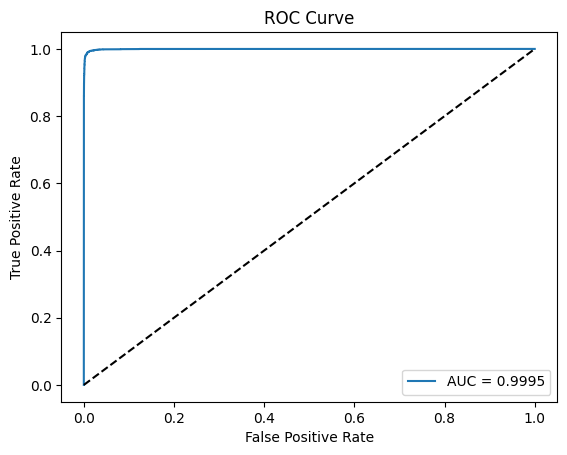

In [203]:
from sklearn.metrics import roc_curve, roc_auc_score
fpr, tpr, tr = roc_curve(df_actual_predicted['y_actual'], df_actual_predicted['y_pred_proba'])
auc = roc_auc_score(df_actual_predicted['y_actual'], df_actual_predicted['y_pred_proba'])

plt.plot(fpr, tpr, label='AUC = %0.4f' %auc)
plt.plot(fpr, fpr, linestyle = '--', color='k')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()

#### KS

In [204]:
df_actual_predicted = df_actual_predicted.sort_values('y_pred_proba')
df_actual_predicted = df_actual_predicted.reset_index()

df_actual_predicted['Cumulative N Population'] = df_actual_predicted.index + 1
df_actual_predicted['Cumulative N Bad'] = df_actual_predicted['y_actual'].cumsum()
df_actual_predicted['Cumulative N Good'] = df_actual_predicted['Cumulative N Population'] - df_actual_predicted['Cumulative N Bad']
df_actual_predicted['Cumulative Perc Population'] = df_actual_predicted['Cumulative N Population'] / df_actual_predicted.shape[0]
df_actual_predicted['Cumulative Perc Bad'] = df_actual_predicted['Cumulative N Bad'] / df_actual_predicted['y_actual'].sum()
df_actual_predicted['Cumulative Perc Good'] = df_actual_predicted['Cumulative N Good'] / (df_actual_predicted.shape[0] - df_actual_predicted['y_actual'].sum())

In [205]:
df_actual_predicted.head()

,index,y_actual,y_pred_proba,Cumulative N Population,Cumulative N Bad,Cumulative N Good,Cumulative Perc Population,Cumulative Perc Bad,Cumulative Perc Good
0,39747,0,2.830751e-07,1,0,1,0.000025,0.0,0.000049
1,47115,0,8.586026e-07,2,0,2,0.000049,0.0,0.000099
2,33505,0,1.518413e-06,3,0,3,0.000074,0.0,0.000148
3,34066,0,1.853513e-06,4,0,4,0.000099,0.0,0.000198
4,50796,0,2.607059e-06,5,0,5,0.000124,0.0,0.000247


Text(0.5, 1.0, 'Kolmogorov-Smirnov:  0.9815')

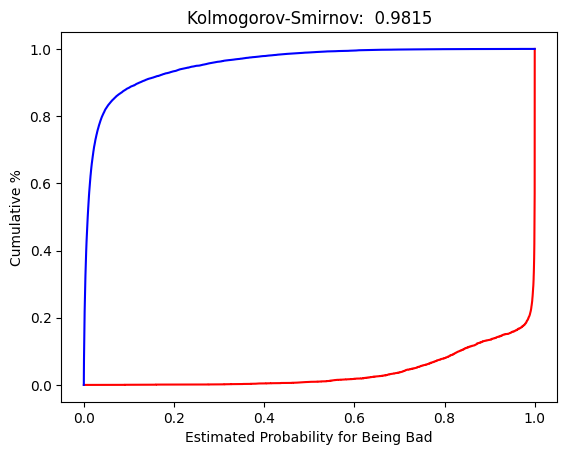

In [206]:
KS = max(df_actual_predicted['Cumulative Perc Good'] - df_actual_predicted['Cumulative Perc Bad'])

plt.plot(df_actual_predicted['y_pred_proba'], df_actual_predicted['Cumulative Perc Bad'], color='r')
plt.plot(df_actual_predicted['y_pred_proba'], df_actual_predicted['Cumulative Perc Good'], color='b')
plt.xlabel('Estimated Probability for Being Bad')
plt.ylabel('Cumulative %')
plt.title('Kolmogorov-Smirnov:  %0.4f' %KS)

Model yang dibangun menghasilkan performa `AUC = 0.99` dan `KS = 0.98`. Performa Model Sudah Baik